# Multimodal Fusion: Model Fusion

# Section 0: Import modules, set variables, load functions 

In [1]:
import os
import numpy as np
import pandas as pd
from keras import backend as K
from sklearn.metrics import confusion_matrix    
from sklearn import metrics
from keras.models import Model
from keras.layers import Dense, Reshape, concatenate, Lambda, Average, Maximum, Add, Multiply, Concatenate, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers.embeddings import Embedding
from keras.engine.input_layer import Input
from keras.optimizers import Adam
from utils import *
from keras.activations import relu
from sklearn.model_selection import StratifiedKFold
import random
import dill
import matplotlib.pyplot as plt
from scipy import ndimage
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from PIL import Image
import io
from keras.utils.training_utils import multi_gpu_model
import tensorflow as tf

Using TensorFlow backend.


In [2]:
from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())
G = len(K.tensorflow_backend._get_available_gpus())

['/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1']


In [3]:
SRC = 'PMC'

if SRC=='PMC':
    CLASSES = {0: 'bar', 1: 'gel', 2: 'map', 3: 'network', 4: 'plot',
             5: 'text', 6: 'box', 7: 'heatmap',8: 'medical', 9: 'nxmls', 10: 'screenshot',
             11: 'topology', 12: 'diagram', 13: 'histology', 14: 'microscopy',
             15: 'photo', 16: 'sequence', 17: 'tree', 18: 'fluorescence', 19: 'line',
             20: 'molecular', 21: 'pie', 22: 'table'}
    
    class_names = ['bar', 'gel', 'network', 'plot', 'histology', 'sequence',
                               'line', 'molecular']
else:
    class_names = ['cat','dog']
num_class = len(class_names)
NN_Class_Names = dict(enumerate(class_names))
test_size = 0.2
epochs = 150
#Set parameters
create_word_vec = False
w2v_epochs = 20
w2v_window_size=5
w2v_filters=''
seed = 0
max_text_len = 200
vocabulary_size = 10000
csv_fname = 'image_list.csv'
coco_loc = '/home/kevin/Documents/Lab/coco_dataset'
pmc_loc = '/gpfs/ysm/pi/krauthammer/kl533/'
filters = ''
use_glove = False
LOAD_IMG_MODEL_WEIGHTS = False
LOAD_TXT_MODEL_WEIGHTS = False
CHANNELS = 3#should be either 3 or 1 for the number of channels
shape = (100,100,CHANNELS)#image shape
embedding_output_dim = 100
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None)
nltk.download('punkt')
nltk.download('stopwords')
plt.rcParams["figure.dpi"] = 600
n_splits = 5

[nltk_data] Downloading package punkt to /home/kl533/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/kl533/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
def Generate_Model(image = True, text = True):
    #set up our text input
    if image and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=True, weights=[embedding_weights])
        text_embedding = embedding(input_text)
        #set up our image branch
        image_input = Input(shape, name='image_input')
        image_branch = get_img_branch()(image_input)
        
        #set up text branch
        text_branch = get_text_branch()(text_embedding)
        
        concat = concatenate([image_branch, text_branch])
            #Dense section
        x = Dense(1024, activation='relu', name='dense_layer1')(concat)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='output')(x)
        classificationModel = Model(inputs=[input_text, image_input], outputs=[output])
    if image and (not text):
        image_input = Input(shape, name='image_input')
        x = get_img_branch()(image_input)
        x = Dense(1024, activation='relu', name='dense_layer1')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='output')(x)
        classificationModel = Model(inputs=[image_input], outputs=[output])
    if (not image) and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=True, weights=[embedding_weights])
        text_embedding = embedding(input_text)       
        x = get_text_branch()(text_embedding)
        x = Dense(1024, activation='relu', name='dense_layer1')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, activation='relu', name='dense_layer2')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='output')(x)
        classificationModel = Model(inputs=[input_text], outputs=[output])
    if G > 1:
        classificationModel = get_multi_gpu_model(classificationModel, G)
    return classificationModel

# Section 1: Initalize variables and load data

In [5]:
print('Getting Data')
if SRC == 'PMC':
    image_classes = [list(CLASSES.keys())[list(CLASSES.values()).index(x)] for 
                 x in class_names]  
    data = load_PMC(csv_fname, image_classes, uniform=True)
    #dynamically add location of files
    data['location'] = pmc_loc + data['location'].astype(str)
else:
    data = load_COCO(coco_loc, class_names=class_names)

Getting Data


## Optional: Create embeddings

In [6]:
#%%Section 0.5 create embeddings - Optional
if create_word_vec:
    print('Section 0.5: create embeddings')
    from w2v_keras import w2v_keras
    w2v = w2v_keras(vocabulary_size=vocabulary_size, window_size=w2v_window_size, filters=w2v_filters, vector_dim = embedding_output_dim)
    w2v.fit(data['caption'], epochs=w2v_epochs)
    w2v.save_embeddings('w2v_embeddings.json')

## Get data into format our model understands

In [7]:
#%% Section 1: Generate our sequences from text
print('Get model data')
(X_text_train, X_text_test, X_image_train, X_image_test, y_train, y_test, 
 tokenizer) = get_model_data(data, seed=seed, test_size = test_size, vocabulary_size = vocabulary_size, 
          filters = filters, max_text_len=max_text_len, shape=shape)

Get model data
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


## Load our word embeddings

In [8]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

## Lets visualize our models:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


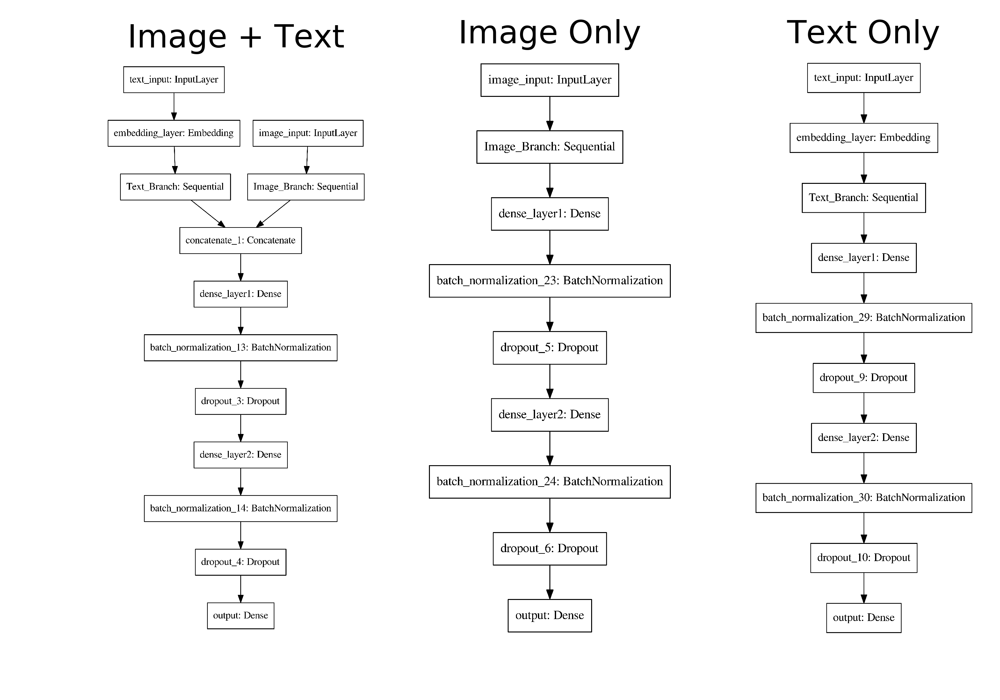

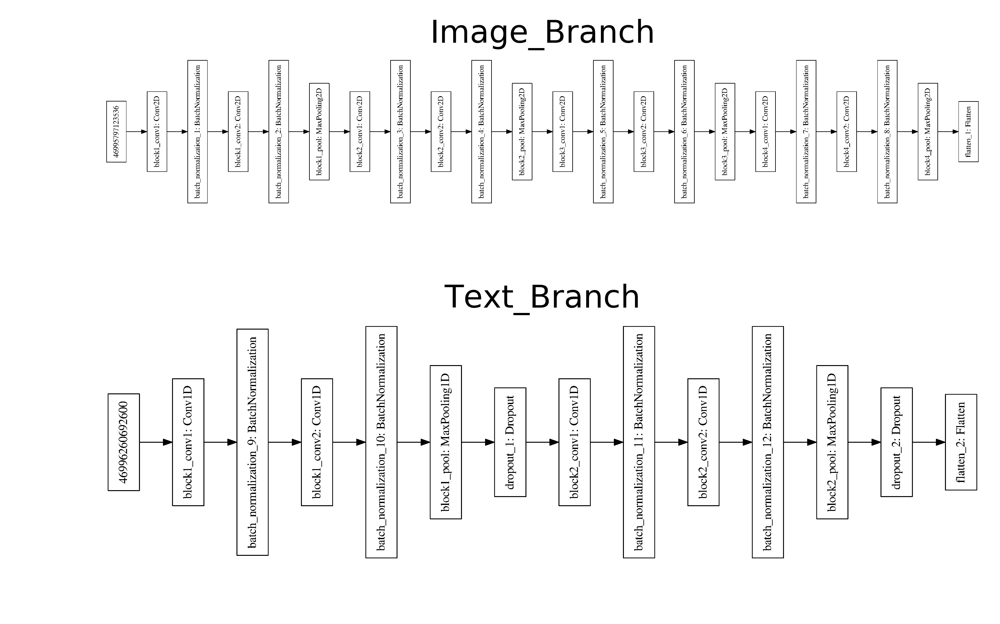

In [9]:
G_bak = G
G = 1
text_image_model_vis = Generate_Model(image = True, text=True)
image_model_vis = Generate_Model(image = True, text=False)
text_model_vis = Generate_Model(image = False, text=True)
G = G_bak
model_list = {'Image + Text': text_image_model_vis, 'Image Only': image_model_vis, 
              'Text Only': text_model_vis}
base_model_list = {'Image_Branch': text_image_model_vis.get_layer('Image_Branch'), 
                   'Text_Branch': text_image_model_vis.get_layer('Text_Branch')}
plt.rcParams["figure.dpi"] = 600
fig,ax = plt.subplots(1,len(model_list))

for i, (name,model) in enumerate(model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

fig,ax = plt.subplots(len(base_model_list),1)
for i, (name,model) in enumerate(base_model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    x_ = ndimage.rotate(x_, 90)
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

# Section 2: Train Test Split

## Train with only images

### Generate model and load callbacks

In [10]:
print('Train on images Only')
image_model = Generate_Model(image = True, text=False)
#set optimizer:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0005, amsgrad=True) #RMSprop(lr=0.001, rho=0.9, epsilon=1e-07, decay=0.0)
image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
# checkpoint
filepath="model_fusion_weights/weights-improvement_image_only.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train on images Only
[INFO] training with 2 GPUs...


### Train model

In [11]:
history = image_model.fit([X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 10s 4ms/step - loss: 2.3765 - acc: 0.3345 - val_loss: 5.2916 - val_acc: 0.2857

Epoch 00001: val_acc improved from -inf to 0.28571, saving model to model_fusion_weights/weights-improvement_image_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.7449 - acc: 0.4631 - val_loss: 3.6066 - val_acc: 0.3849

Epoch 00002: val_acc improved from 0.28571 to 0.38492, saving model to model_fusion_weights/weights-improvement_image_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.4595 - acc: 0.5435 - val_loss: 2.0331 - val_acc: 0.5397

Epoch 00003: val_acc improved from 0.38492 to 0.53968, saving model to model_fusion_weights/weights-improvement_image_only.hdf5
Epoch 4/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.1849 - acc: 0.6125 - val_loss: 1.7879 - val_acc: 0.5278

Epoch 00004: val_acc did no

2263/2263 [==============================] - 2s 1ms/step - loss: 0.0149 - acc: 0.9969 - val_loss: 0.8301 - val_acc: 0.8175

Epoch 00038: val_acc did not improve from 0.81746
Epoch 39/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0132 - acc: 0.9973 - val_loss: 0.8114 - val_acc: 0.8175

Epoch 00039: val_acc did not improve from 0.81746
Epoch 40/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0127 - acc: 0.9973 - val_loss: 0.8133 - val_acc: 0.8135

Epoch 00040: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.

Epoch 00040: val_acc did not improve from 0.81746
Epoch 41/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0145 - acc: 0.9973 - val_loss: 0.8048 - val_acc: 0.8135

Epoch 00041: val_acc did not improve from 0.81746
Epoch 42/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.0112 - acc: 0.9973 - val_loss: 0.7943 - val_acc: 0.8135

Epoch 00042: val_acc did not improve from 0.817

### Plot training history

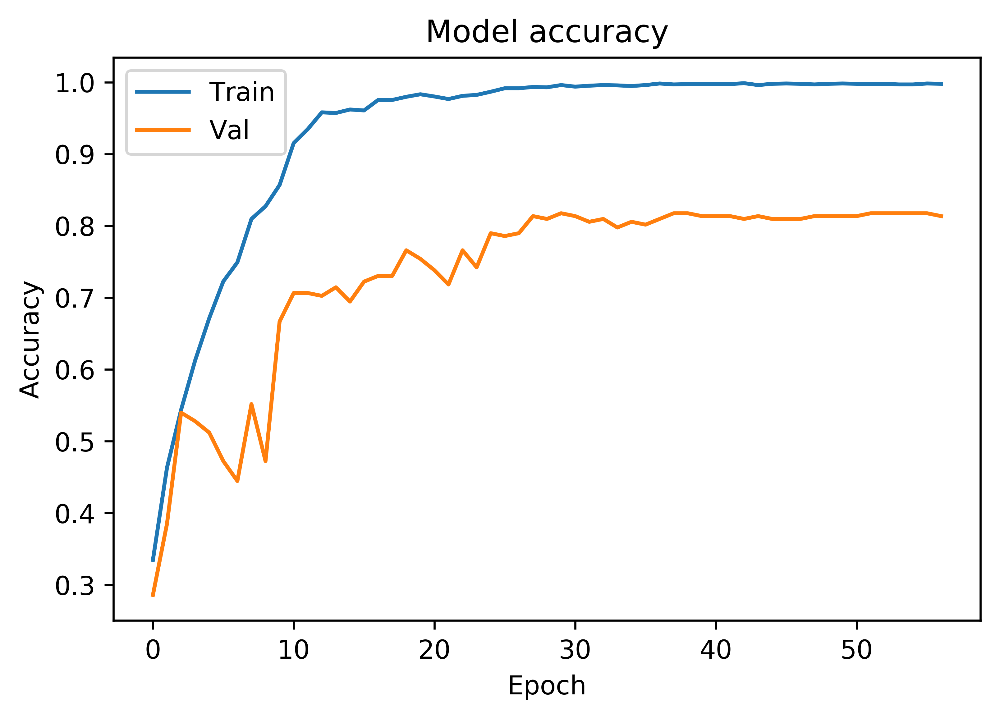

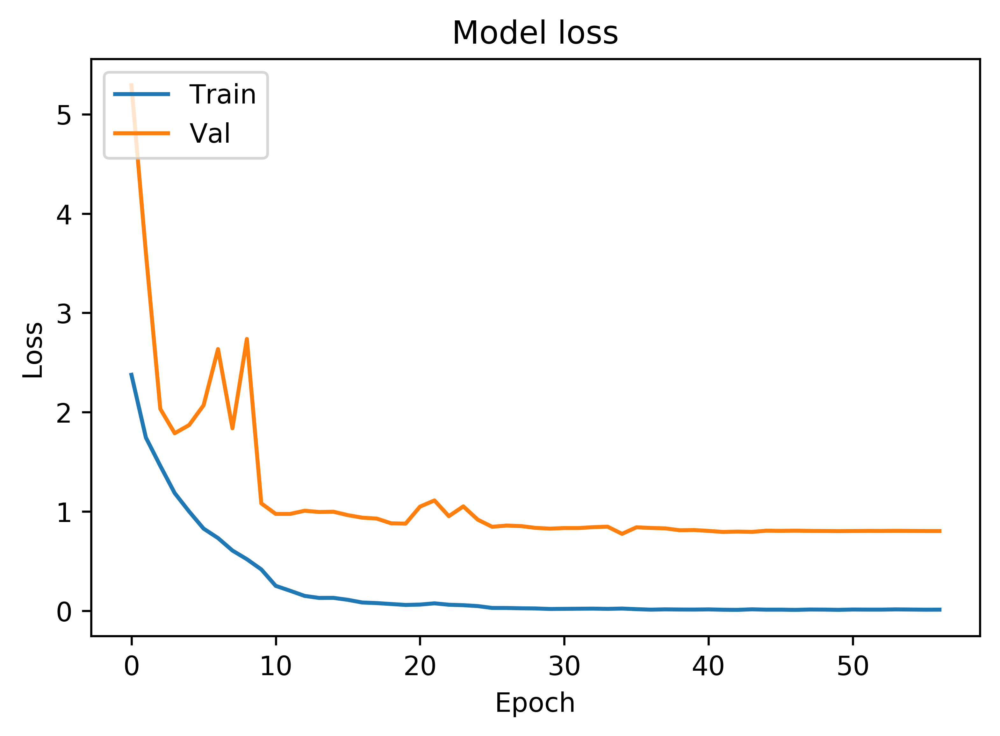

In [12]:
plot_model_history(history)

### Test model

In [13]:
print('Test on Image Only')
y_hat = test_model(image_model, zip(X_image_test, y_test), image = True, text = False, class_names=class_names)

Test on Image Only
629/629 [==============================] - 1s 1ms/step
[0.8508895137162201, 0.7980922104254815]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         59    1        3     2          1         0     6          0
gel          3   81        5     0          1         1     1          0
network      0    1       51     0          0         7     3          3
plot         5    1        3    56          0         0    19          2
histology    0    2        0     0         72         0     0          2
sequence     0    1        2     2          1        63     3          2
line         3    1        9     8          0         2    58          5
molecular    0    0        9     2          4         0     1         62
              precision    recall  f1-score   support

         bar       0.84      0.82      0.83        72
         gel       0.92      0.88      0.90        92
     network       0.62      0.78      0.69        65
        plo

## Train with only text

### Generate model and load callbacks

In [14]:
print('Train on images Only')
text_model = Generate_Model(image = False, text=True)
#set optimizer:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0005, amsgrad=True) #RMSprop(lr=0.001, rho=0.9, epsilon=1e-07, decay=0.0)
text_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
# checkpoint
filepath="model_fusion_weights/weights-improvement_text_only.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train on images Only
[INFO] training with 2 GPUs...


### Train model

In [15]:
history = text_model.fit([X_text_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 5s 2ms/step - loss: 2.9673 - acc: 0.2050 - val_loss: 1.6425 - val_acc: 0.4206

Epoch 00001: val_acc improved from -inf to 0.42063, saving model to model_fusion_weights/weights-improvement_text_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 0s 164us/step - loss: 2.0402 - acc: 0.3584 - val_loss: 1.5623 - val_acc: 0.4524

Epoch 00002: val_acc improved from 0.42063 to 0.45238, saving model to model_fusion_weights/weights-improvement_text_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 0s 157us/step - loss: 1.5665 - acc: 0.4808 - val_loss: 1.4709 - val_acc: 0.4802

Epoch 00003: val_acc improved from 0.45238 to 0.48016, saving model to model_fusion_weights/weights-improvement_text_only.hdf5
Epoch 4/150
2263/2263 [==============================] - 0s 154us/step - loss: 1.2691 - acc: 0.5815 - val_loss: 1.3633 - val_acc: 0.5635

Epoch 00004: val_acc impr

2263/2263 [==============================] - 0s 136us/step - loss: 0.2026 - acc: 0.9337 - val_loss: 0.7161 - val_acc: 0.8373

Epoch 00036: val_acc did not improve from 0.84127
Epoch 37/150
2263/2263 [==============================] - 0s 137us/step - loss: 0.2055 - acc: 0.9315 - val_loss: 0.7149 - val_acc: 0.8373

Epoch 00037: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00037: val_acc did not improve from 0.84127
Epoch 38/150
2263/2263 [==============================] - 0s 136us/step - loss: 0.1936 - acc: 0.9319 - val_loss: 0.7128 - val_acc: 0.8373

Epoch 00038: val_acc did not improve from 0.84127
Epoch 39/150
2263/2263 [==============================] - 0s 133us/step - loss: 0.1942 - acc: 0.9333 - val_loss: 0.7144 - val_acc: 0.8214

Epoch 00039: val_acc did not improve from 0.84127
Epoch 40/150
2263/2263 [==============================] - 0s 134us/step - loss: 0.2040 - acc: 0.9342 - val_loss: 0.7136 - val_acc: 0.8333

Epoch 00040: val_acc did not improve from 0.84127


### Plot training history

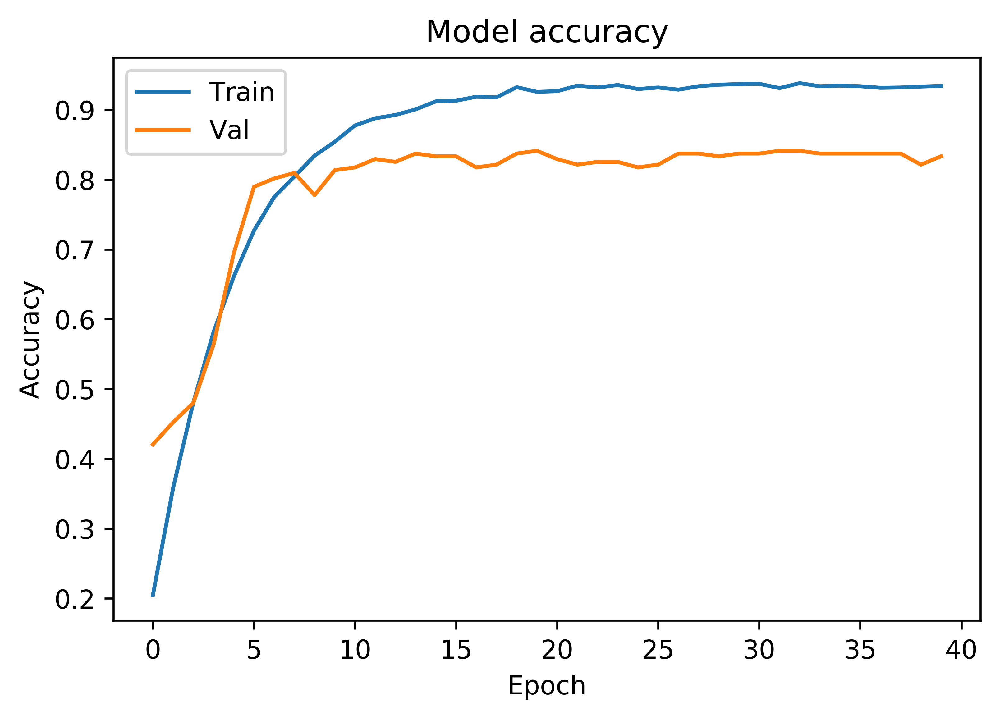

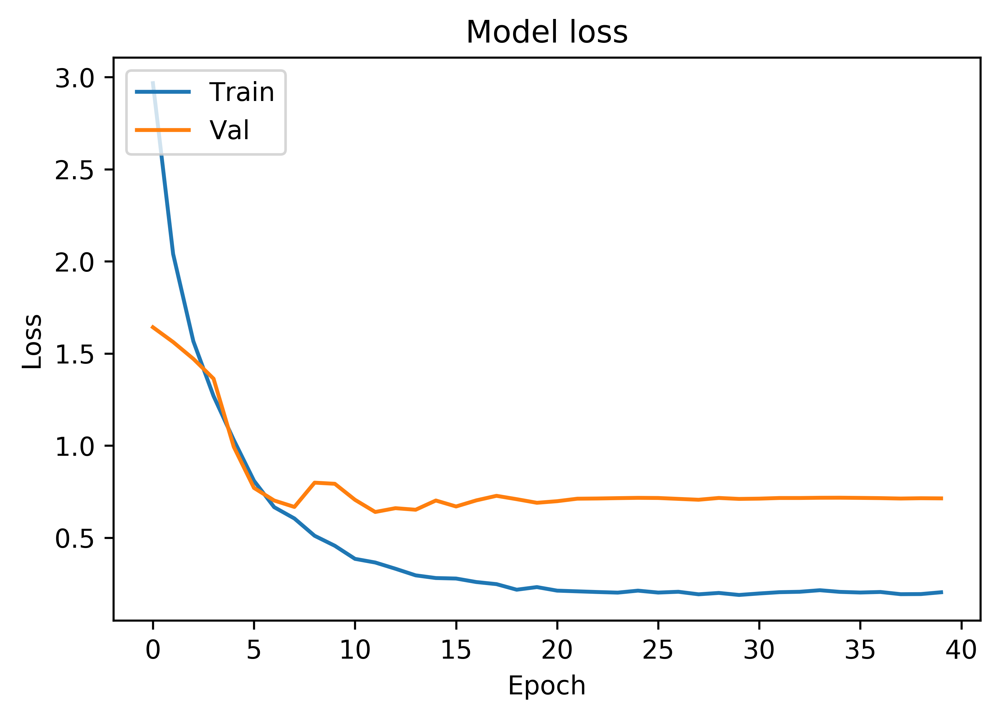

In [16]:
plot_model_history(history)

### Test model

In [17]:
print('Test on Text Only')
y_hat = test_model(text_model, zip(X_text_test, y_test), image = False, text = True, class_names=class_names)

Test on Text Only
629/629 [==============================] - 0s 310us/step
[1.0136574360827764, 0.7949125599974858]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         45    3        5     3          5         3     8          0
gel          2   68        1     1         12         1     7          0
network      2    1       57     0          0         0     2          3
plot         8    1        2    62          6         1     5          1
histology    0    1        1     3         70         0     1          0
sequence     0    3        0     0          0        69     0          2
line        10    0        5     7          2         2    60          0
molecular    0    0        3     0          5         1     0         69
              precision    recall  f1-score   support

         bar       0.67      0.62      0.65        72
         gel       0.88      0.74      0.80        92
     network       0.77      0.88      0.82        65
        pl

## Model fusion: Test with images and text

### Generate model and load callbacks

In [18]:
print('Train on images + text')
text_image_model = Generate_Model(image = True, text=True)
#set optimizer:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0005, amsgrad=True) #RMSprop(lr=0.001, rho=0.9, epsilon=1e-07, decay=0.0)
text_image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
# checkpoint
filepath="model_fusion_weights/weights-improvement_image_text.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train on images + text
[INFO] training with 2 GPUs...


### Train model

In [19]:
history = text_image_model.fit([X_text_train, X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 10s 5ms/step - loss: 2.2921 - acc: 0.3584 - val_loss: 1.9728 - val_acc: 0.4603

Epoch 00001: val_acc improved from -inf to 0.46032, saving model to model_fusion_weights/weights-improvement_image_text.hdf5
Epoch 2/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.3315 - acc: 0.5811 - val_loss: 1.7361 - val_acc: 0.5754

Epoch 00002: val_acc improved from 0.46032 to 0.57540, saving model to model_fusion_weights/weights-improvement_image_text.hdf5
Epoch 3/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.9245 - acc: 0.6947 - val_loss: 1.0332 - val_acc: 0.7103

Epoch 00003: val_acc improved from 0.57540 to 0.71032, saving model to model_fusion_weights/weights-improvement_image_text.hdf5
Epoch 4/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.6529 - acc: 0.7729 - val_loss: 0.9650 - val_acc: 0.7381

Epoch 00004: val_acc improv

### Plot training history

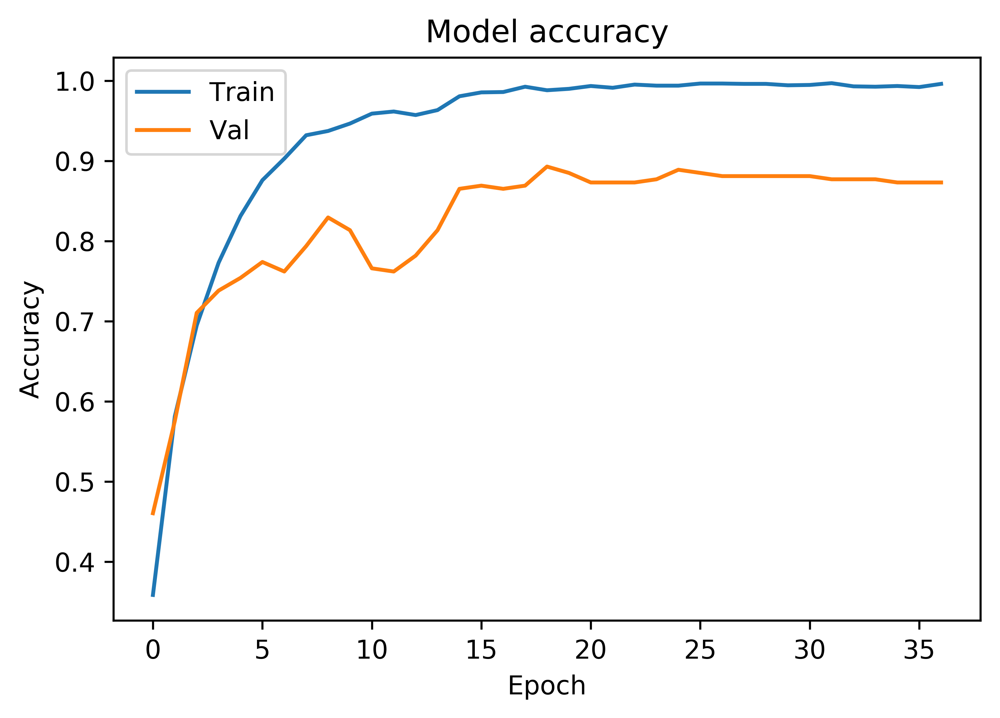

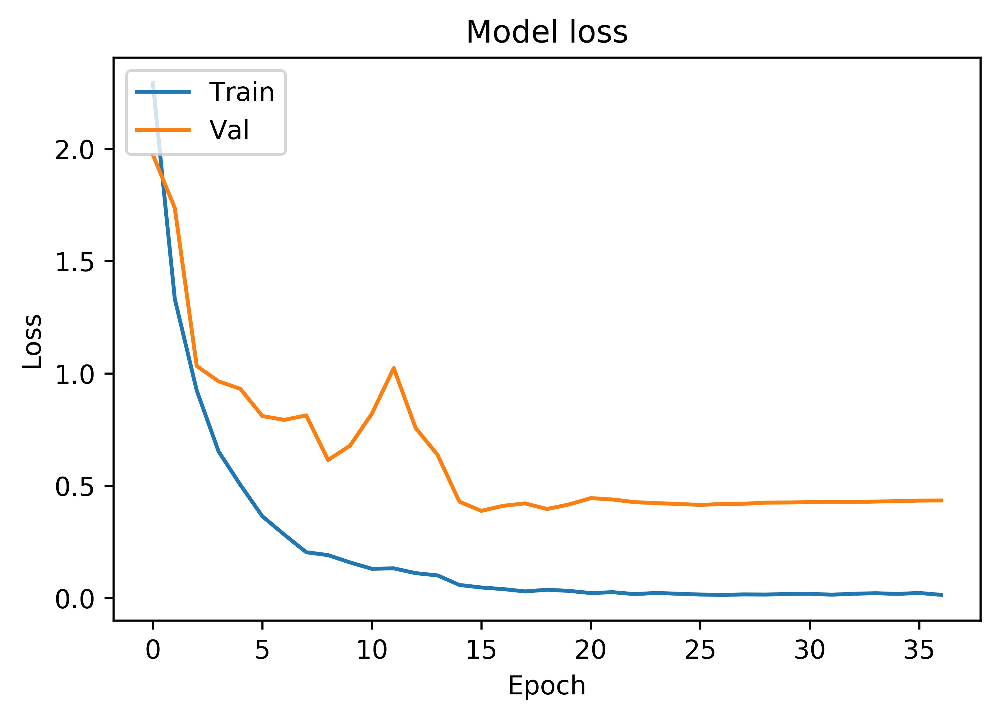

In [20]:
plot_model_history(history)

### Test our model on test set

In [21]:
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True, class_names=class_names)

629/629 [==============================] - 0s 782us/step
[0.4127187486056872, 0.8903020670569379]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         63    0        2     3          1         0     2          1
gel          2   87        1     0          1         1     0          0
network      0    0       58     0          0         0     2          5
plot         5    1        2    65          0         0    11          2
histology    0    1        0     0         74         0     1          0
sequence     1    2        0     0          0        71     0          0
line         2    0        4     4          0         0    71          5
molecular    0    0        2     1          1         0     3         71
              precision    recall  f1-score   support

         bar       0.86      0.88      0.87        72
         gel       0.96      0.95      0.95        92
     network       0.84      0.89      0.87        65
        plot       0.89     

### Inspect misclassifications

blue = ground truth, red = prediction


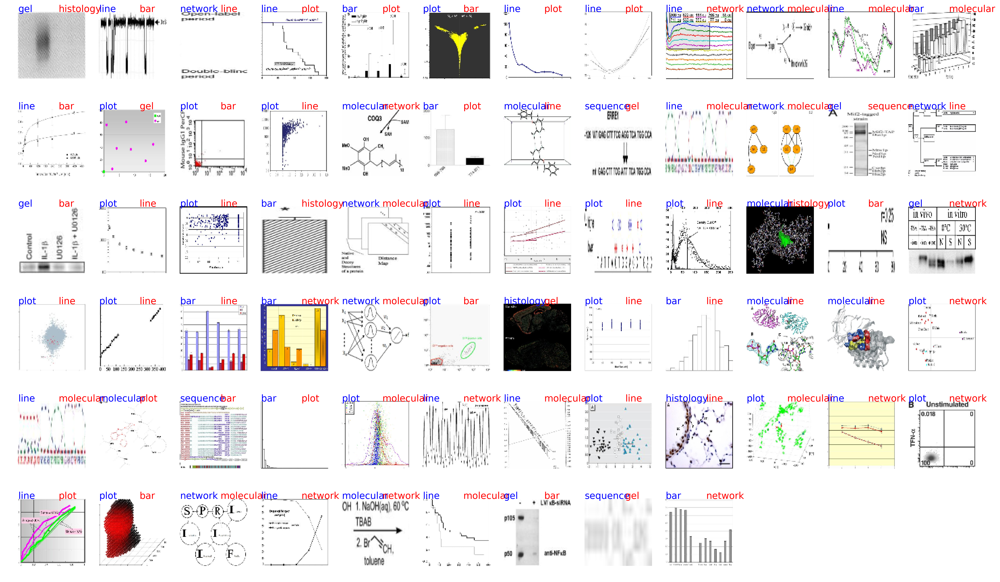

In [22]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### Load and test using best val_acc weights

In [23]:
text_image_model.layers[-2].load_weights(filepath)#as per the multigpu checkpoint
#text_image_model.load_weights(filepath)
print('Test on Image + text')
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test))

Test on Image + text
629/629 [==============================] - 0s 722us/step
[0.4507445303785403, 0.8823529412712315]
    0   1   2   3   4   5   6   7
0  64   1   2   1   1   0   3   0
1   1  87   2   0   1   1   0   0
2   0   0  57   0   1   1   2   4
3   2   3   4  62   0   1  11   3
4   0   1   0   0  75   0   0   0
5   1   2   0   0   0  71   0   0
6   2   0   6   2   0   1  69   6
7   0   0   3   0   2   1   2  70
              precision    recall  f1-score   support

           0       0.91      0.89      0.90        72
           1       0.93      0.95      0.94        92
           2       0.77      0.88      0.82        65
           3       0.95      0.72      0.82        86
           4       0.94      0.99      0.96        76
           5       0.93      0.96      0.95        74
           6       0.79      0.80      0.80        86
           7       0.84      0.90      0.87        78

   micro avg       0.88      0.88      0.88       629
   macro avg       0.88      0.88

# Section 3: K-Fold Validation

### Get data into format our model understands

In [24]:
#Get all data to kfoldsplit
X_text, X_image, y, tokenizer = get_model_data(data, seed=seed, test_size = test_size, 
                vocabulary_size = vocabulary_size, filters = filters, 
                max_text_len=max_text_len, shape=shape, split=True)
X_text = np.array(X_text)#need to fix this!!!!!!!!!!!!!!!!!!!!!!!!!!!

filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


### Load our word embeddings

In [25]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

### K fold validation on images only

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 9s 4ms/step - loss: 2.4024 - acc: 0.3248 - val_loss: 4.0089 - val_acc: 0.3452

Epoch 00001: val_acc improved from -inf to 0.34524, saving model to model_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.7846 - acc: 0.4566 - val_loss: 1.9637 - val_acc: 0.4841

Epoch 00002: val_acc improved from 0.34524 to 0.48413, saving model to model_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.4737 - acc: 0.5389 - val_loss: 2.4519 - val_acc: 0.5238

Epoch 00003: val_acc improved from 0.48413 to 0.52381, saving model to model_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.1799 - acc: 0.6040 - val_loss: 1.6995 - v

2260/2260 [==============================] - 2s 1ms/step - loss: 0.0210 - acc: 0.9938 - val_loss: 0.5854 - val_acc: 0.8333

Epoch 00037: val_acc did not improve from 0.83333
Epoch 38/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0184 - acc: 0.9934 - val_loss: 0.6632 - val_acc: 0.8175

Epoch 00038: val_acc did not improve from 0.83333
Epoch 39/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0231 - acc: 0.9916 - val_loss: 0.6806 - val_acc: 0.8175

Epoch 00039: val_acc did not improve from 0.83333
Epoch 40/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0136 - acc: 0.9969 - val_loss: 0.6620 - val_acc: 0.8413

Epoch 00040: val_acc improved from 0.83333 to 0.84127, saving model to model_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0304 - acc: 0.9934 - val_loss: 0.6813 - val_acc: 0.8254

Epoch 00041: val_acc did not improve from 0.84127

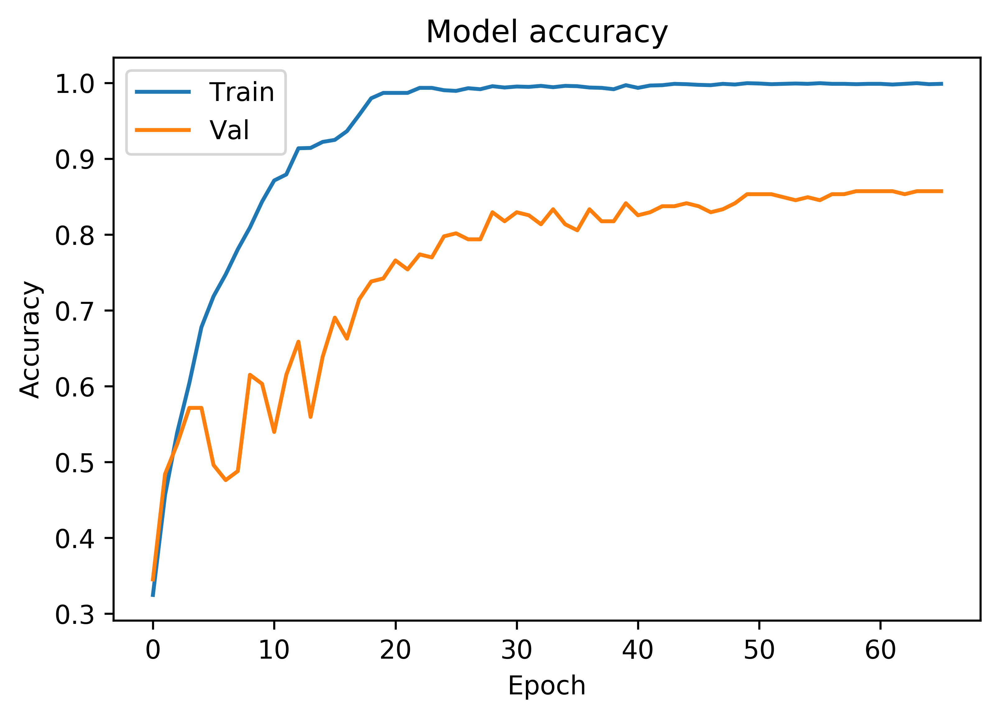

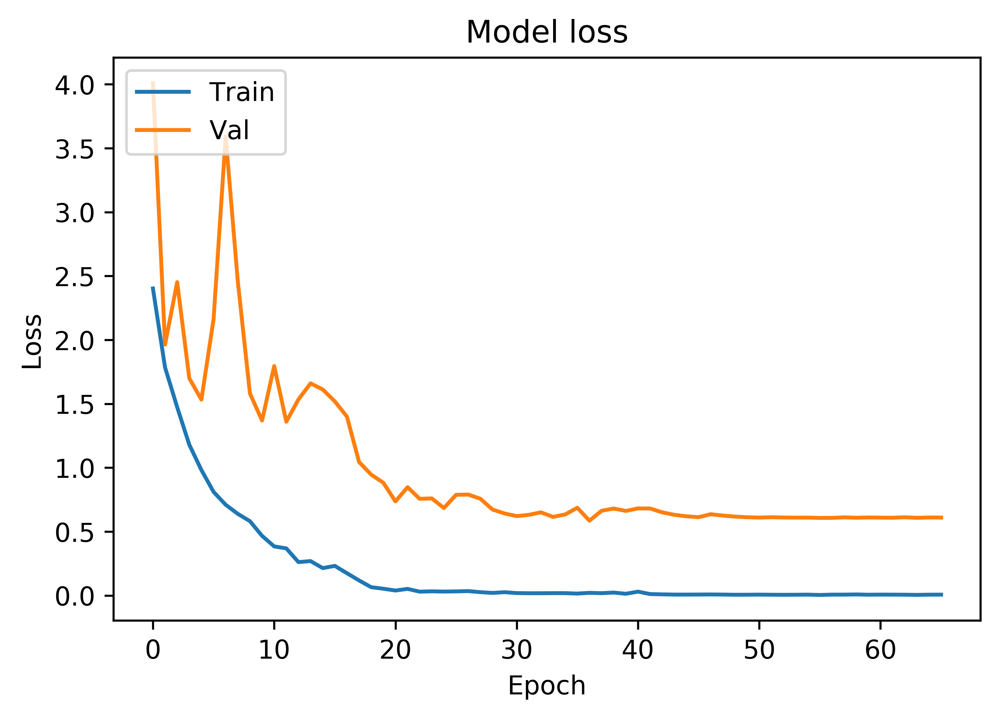

Results from K-fold: 1
acc: 82.91%
632/632 [==============================] - 0s 703us/step
[0.7528571648688256, 0.8291139232961438]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         66    3        1     4          1         3     1          0
gel          3   70        1     2          1         1     0          1
network      2    3       58     3          1         6     0          6
plot         3    1        2    62          0         0    10          1
histology    0    0        0     0         77         0     0          2
sequence     0    1        3     0          1        73     1          0
line         4    3        8    10          0         1    53          0
molecular    0    0        5     2          3         1     3         65
              precision    recall  f1-score   support

         bar       0.85      0.84      0.84        79
         gel       0.86      0.89      0.87        79
     network       0.74      0.73      0.74    

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0104 - acc: 0.9982 - val_loss: 0.9615 - val_acc: 0.7619

Epoch 00030: val_acc did not improve from 0.79365
Epoch 31/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0164 - acc: 0.9956 - val_loss: 0.8693 - val_acc: 0.7778

Epoch 00031: val_acc did not improve from 0.79365
Epoch 32/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0151 - acc: 0.9951 - val_loss: 0.8613 - val_acc: 0.7698

Epoch 00032: val_acc did not improve from 0.79365
Epoch 33/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0097 - acc: 0.9996 - val_loss: 0.8801 - val_acc: 0.7698

Epoch 00033: val_acc did not improve from 0.79365
Epoch 34/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0112 - acc: 0.9969 - val_loss: 0.9230 - val_acc: 0.7540

Epoch 00034: val_acc did not improve from 0.79365
Epoch 35/150
2260/2260 [==============================] - 3s 1ms/step - loss: 

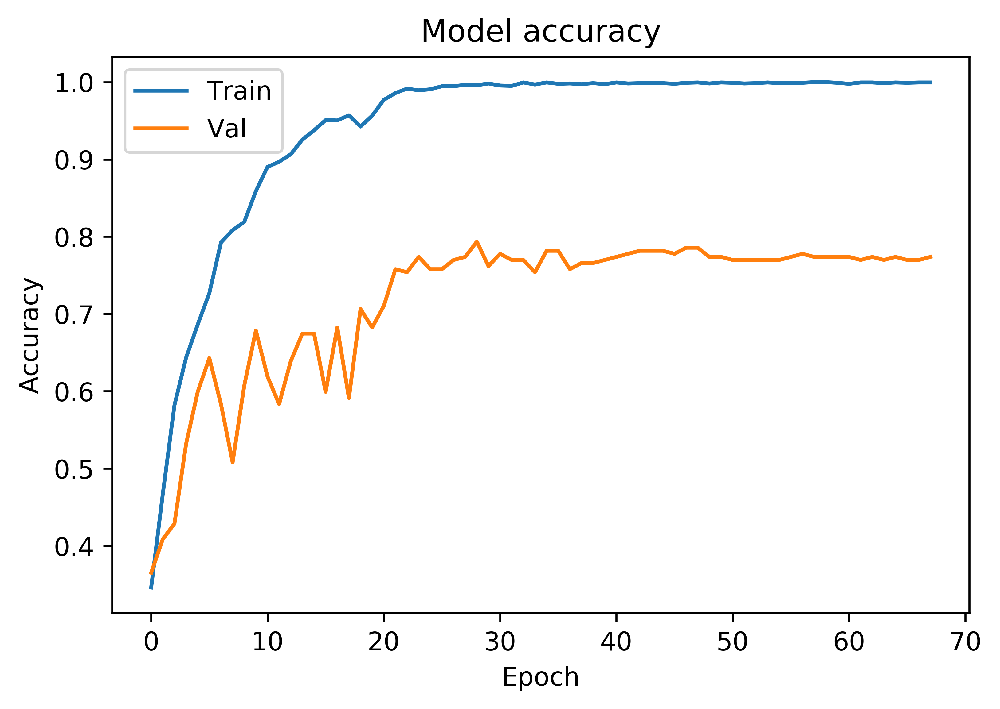

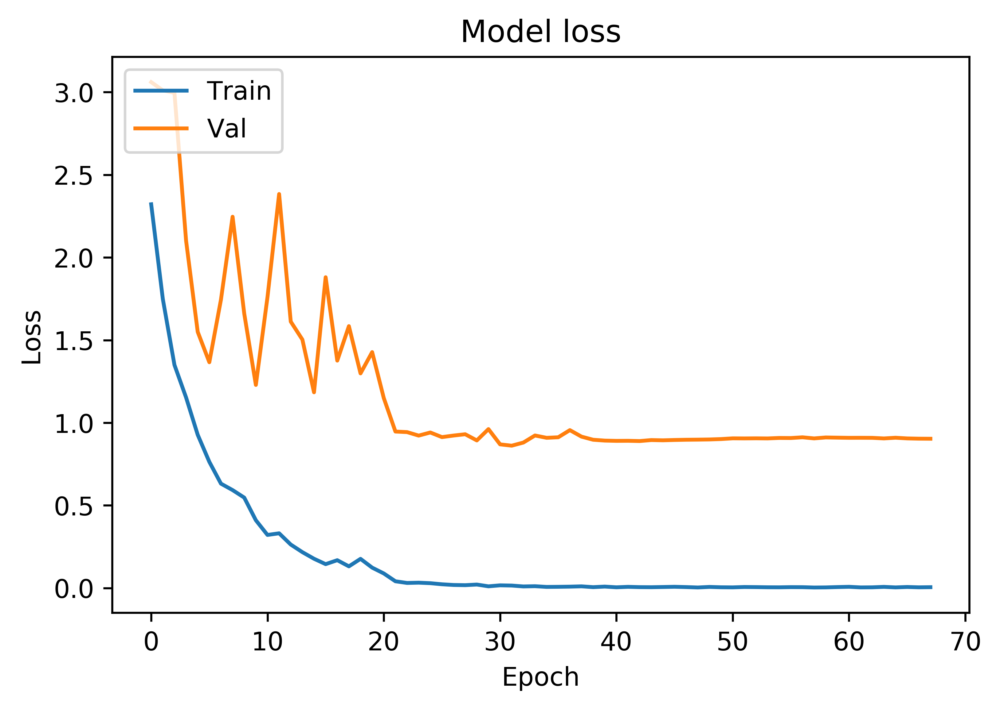

Results from K-fold: 2
acc: 79.75%
632/632 [==============================] - 1s 828us/step
[0.8371123631920996, 0.7974683536758905]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         66    1        4     2          0         1     5          0
gel          2   71        3     1          0         1     1          0
network      3    3       52     3          1         6     6          5
plot         2    0        0    56          1         0    16          4
histology    0    3        0     0         68         0     0          8
sequence     1    1        3     1          1        72     0          0
line         0    2        3    11          2         3    51          7
molecular    0    0        4     1          2         1     3         68
              precision    recall  f1-score   support

         bar       0.89      0.84      0.86        79
         gel       0.88      0.90      0.89        79
     network       0.75      0.66      0.70    

2260/2260 [==============================] - 2s 1ms/step - loss: 0.0201 - acc: 0.9960 - val_loss: 0.7937 - val_acc: 0.7976

Epoch 00030: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00030: val_acc did not improve from 0.80556
Epoch 31/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0197 - acc: 0.9947 - val_loss: 0.7724 - val_acc: 0.8095

Epoch 00031: val_acc improved from 0.80556 to 0.80952, saving model to model_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 32/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0181 - acc: 0.9965 - val_loss: 0.7625 - val_acc: 0.8135

Epoch 00032: val_acc improved from 0.80952 to 0.81349, saving model to model_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 33/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0129 - acc: 0.9978 - val_loss: 0.7591 - val_acc: 0.8135

Epoch 00033: val_acc did not improve from 0.81349
Epoch 34/150
2260/2260 [=

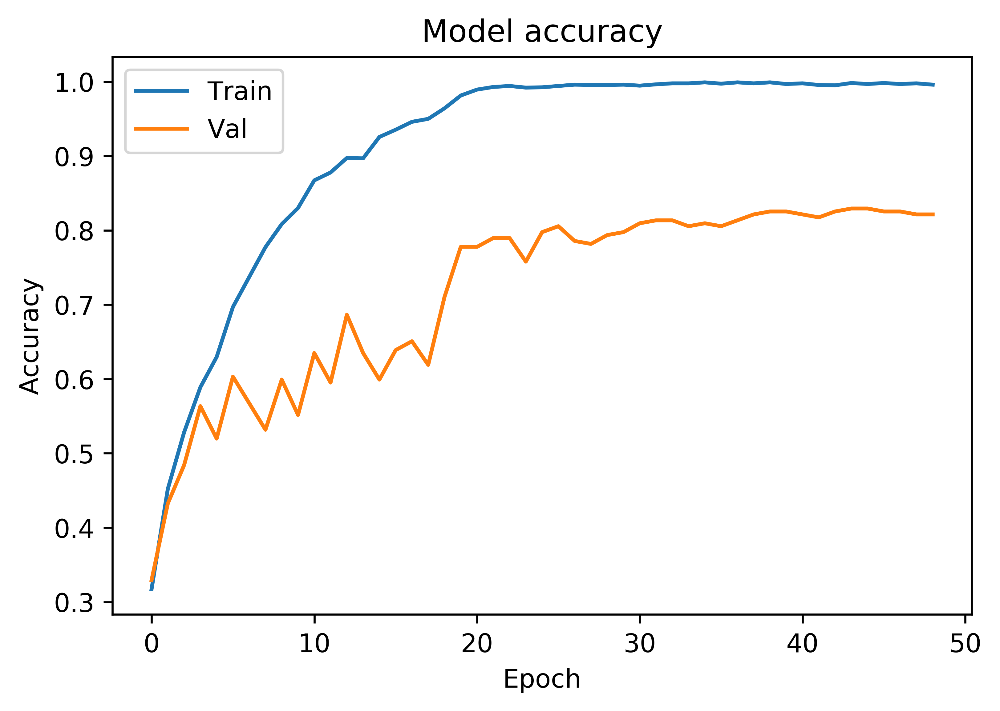

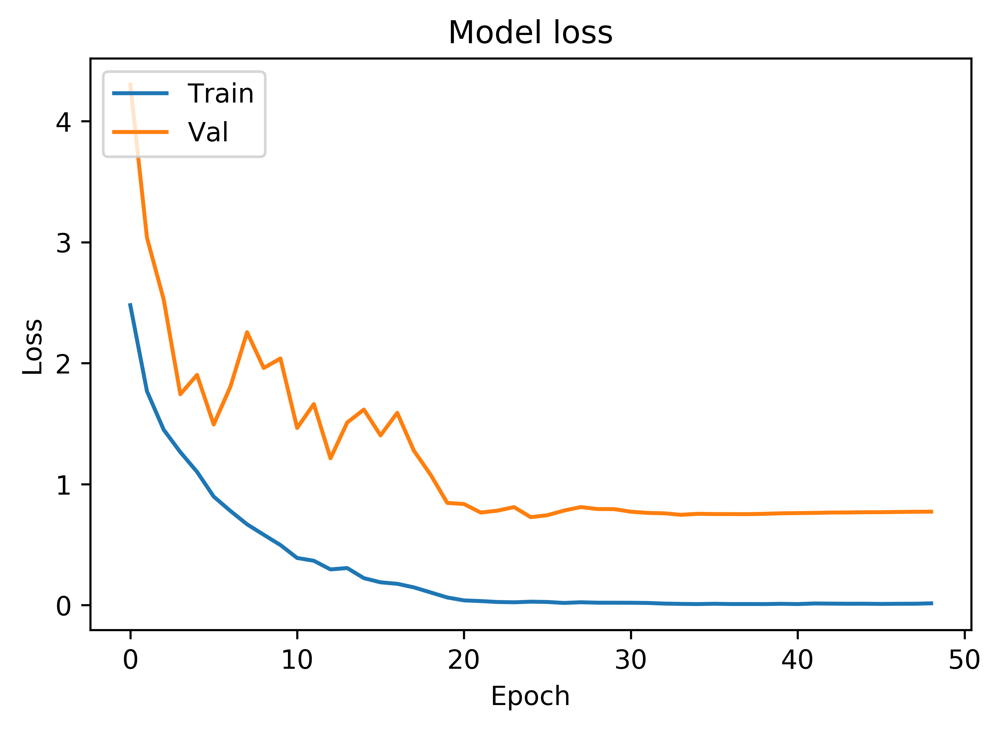

Results from K-fold: 3
acc: 82.91%
632/632 [==============================] - 1s 805us/step
[0.6653010810289202, 0.8291139232961438]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         73    3        0     1          0         0     2          0
gel          1   71        5     0          0         0     1          1
network      1    2       50     3          0         9     8          6
plot         0    3        4    61          1         0    10          0
histology    0    1        0     0         75         0     0          3
sequence     1    0        6     1          0        69     2          0
line         1    1        3    15          1         1    56          1
molecular    0    1        5     0          1         1     2         69
              precision    recall  f1-score   support

         bar       0.95      0.92      0.94        79
         gel       0.87      0.90      0.88        79
     network       0.68      0.63      0.66    

2268/2268 [==============================] - 3s 1ms/step - loss: 0.0249 - acc: 0.9929 - val_loss: 0.7548 - val_acc: 0.8016

Epoch 00029: val_acc did not improve from 0.81746
Epoch 30/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0182 - acc: 0.9943 - val_loss: 0.7208 - val_acc: 0.8175

Epoch 00030: val_acc did not improve from 0.81746
Epoch 31/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0190 - acc: 0.9929 - val_loss: 0.7240 - val_acc: 0.8175

Epoch 00031: val_acc improved from 0.81746 to 0.81746, saving model to model_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 32/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0214 - acc: 0.9934 - val_loss: 0.7227 - val_acc: 0.8095

Epoch 00032: val_acc did not improve from 0.81746
Epoch 33/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0190 - acc: 0.9943 - val_loss: 0.7119 - val_acc: 0.8135

Epoch 00033: val_acc did not improve from 0.81746

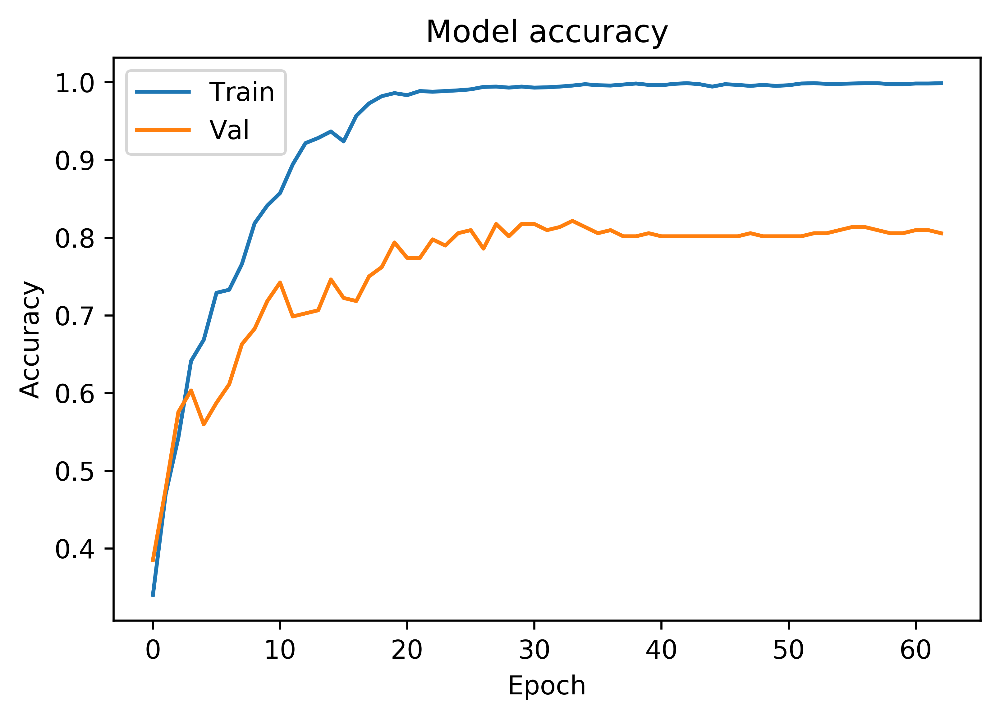

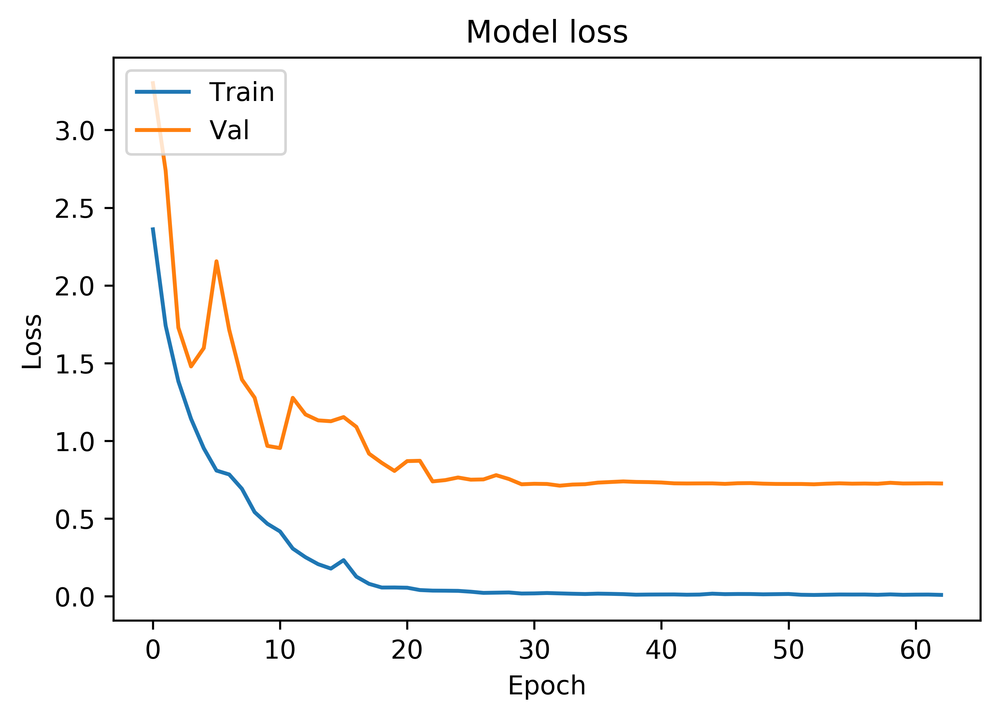

Results from K-fold: 4
acc: 81.09%
624/624 [==============================] - 0s 790us/step
[0.7430974138088715, 0.8108974358974359]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         67    1        1     3          0         0     6          0
gel          2   71        3     2          0         0     0          0
network      0    3       52     5          0         5     6          7
plot         2    1        2    60          0         0    13          0
histology    0    1        0     1         74         0     0          2
sequence     1    2        5     0          1        67     1          1
line         1    0        3     9          2         1    60          2
molecular    0    1       13     0          5         2     2         55
              precision    recall  f1-score   support

         bar       0.92      0.86      0.89        78
         gel       0.89      0.91      0.90        78
     network       0.66      0.67      0.66    


Epoch 00029: val_acc did not improve from 0.80556
Epoch 30/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0304 - acc: 0.9929 - val_loss: 0.8080 - val_acc: 0.7976

Epoch 00030: val_acc did not improve from 0.80556
Epoch 31/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0227 - acc: 0.9907 - val_loss: 0.7556 - val_acc: 0.7738

Epoch 00031: val_acc did not improve from 0.80556
Epoch 32/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0152 - acc: 0.9969 - val_loss: 0.7642 - val_acc: 0.7897

Epoch 00032: val_acc did not improve from 0.80556
Epoch 33/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0138 - acc: 0.9965 - val_loss: 0.7733 - val_acc: 0.7778

Epoch 00033: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00033: val_acc did not improve from 0.80556
Epoch 34/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0192 - acc: 0.9960 - val_loss: 0.7634 -

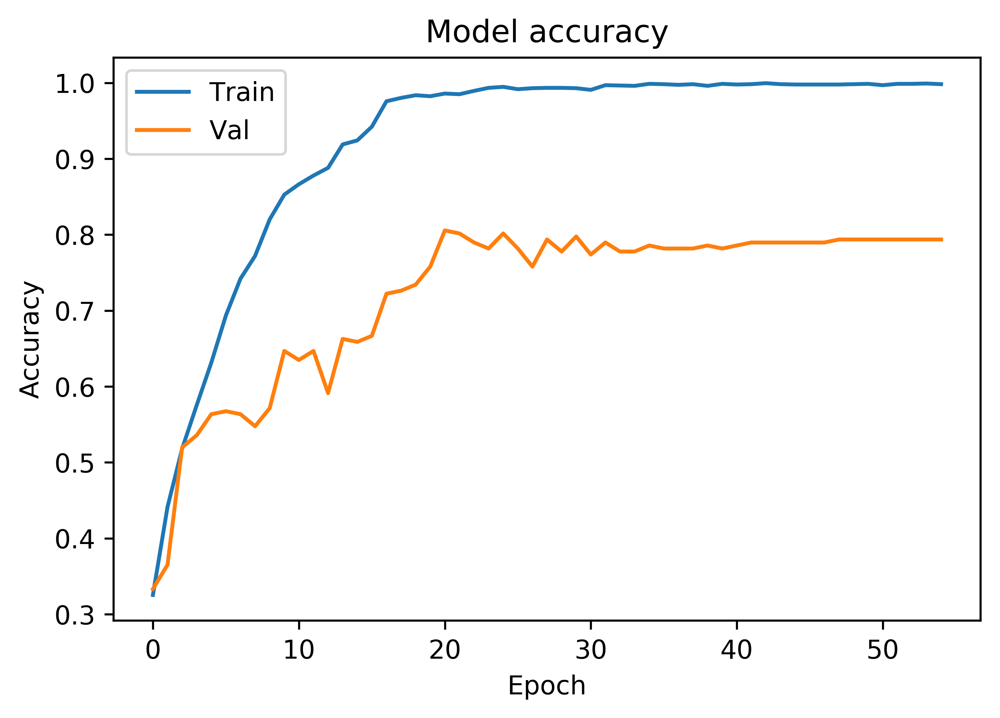

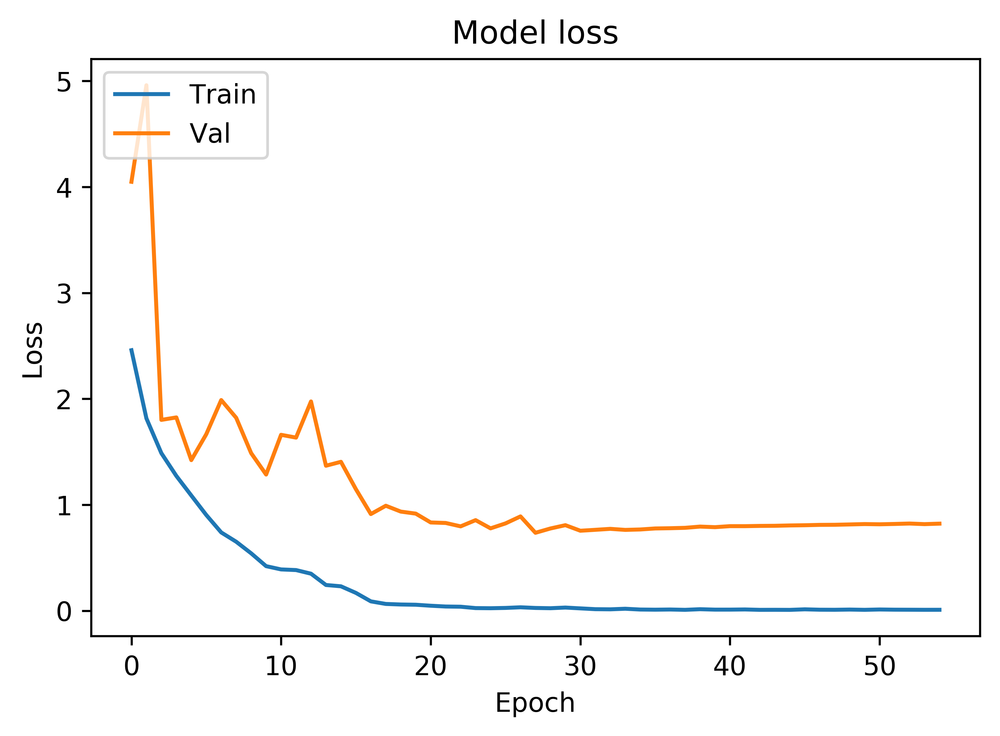

Results from K-fold: 5
acc: 81.25%
624/624 [==============================] - 1s 814us/step
[0.8368639714824848, 0.8125]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         66    2        4     3          1         0     1          1
gel          1   67        0     3          4         1     1          1
network      1    0       56     1          2         4     6          8
plot         3    0        6    54          1         0    12          2
histology    0    0        1     0         76         0     0          1
sequence     2    1        6     0          0        67     2          0
line         2    0        6     8          1         2    53          6
molecular    0    1        5     0          1         1     2         68
              precision    recall  f1-score   support

         bar       0.88      0.85      0.86        78
         gel       0.94      0.86      0.90        78
     network       0.67      0.72      0.69        78
     

In [26]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    image_model = Generate_Model(image = True, text=False)
    image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_image_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = image_model.fit([X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_image_only_k-fold_{}.hdf5".format(count)
    image_model.save_weights(filepath)
    scores = image_model.evaluate([X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(image_model, zip(X_image[test], y[test]), image = True, text = False, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

### K fold validation on text only

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 9s 4ms/step - loss: 2.8337 - acc: 0.2022 - val_loss: 2.0083 - val_acc: 0.3413

Epoch 00001: val_acc improved from -inf to 0.34127, saving model to model_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 0s 170us/step - loss: 2.0292 - acc: 0.3774 - val_loss: 1.4949 - val_acc: 0.5317

Epoch 00002: val_acc improved from 0.34127 to 0.53175, saving model to model_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 0s 165us/step - loss: 1.4843 - acc: 0.5173 - val_loss: 1.2913 - val_acc: 0.5873

Epoch 00003: val_acc improved from 0.53175 to 0.58730, saving model to model_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 0s 177us/step - loss: 1.1505 - acc: 0.6372 - val_loss: 1.4467 

2260/2260 [==============================] - 0s 146us/step - loss: 0.1936 - acc: 0.9398 - val_loss: 1.2519 - val_acc: 0.7579

Epoch 00038: val_acc did not improve from 0.76984
Epoch 39/150
2260/2260 [==============================] - 0s 145us/step - loss: 0.1772 - acc: 0.9429 - val_loss: 1.2545 - val_acc: 0.7579

Epoch 00039: val_acc did not improve from 0.76984
Epoch 40/150
2260/2260 [==============================] - 0s 144us/step - loss: 0.1815 - acc: 0.9385 - val_loss: 1.2549 - val_acc: 0.7579

Epoch 00040: val_acc did not improve from 0.76984
Epoch 41/150
2260/2260 [==============================] - 0s 145us/step - loss: 0.1850 - acc: 0.9336 - val_loss: 1.2581 - val_acc: 0.7579

Epoch 00041: val_acc did not improve from 0.76984
Epoch 42/150
2260/2260 [==============================] - 0s 150us/step - loss: 0.2016 - acc: 0.9389 - val_loss: 1.2653 - val_acc: 0.7579

Epoch 00042: val_acc did not improve from 0.76984


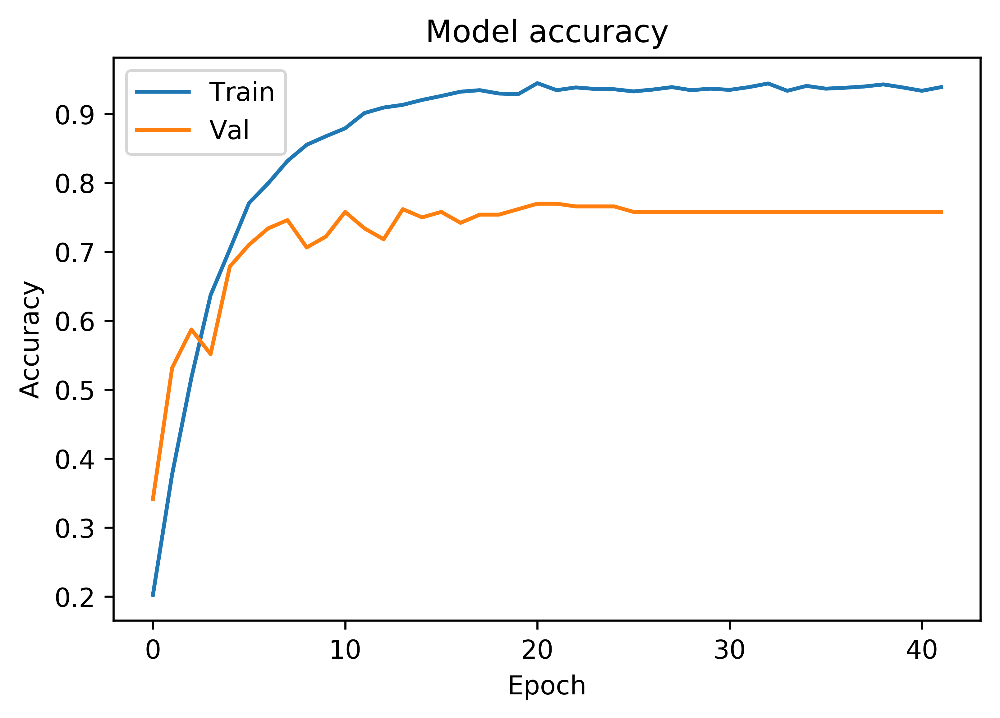

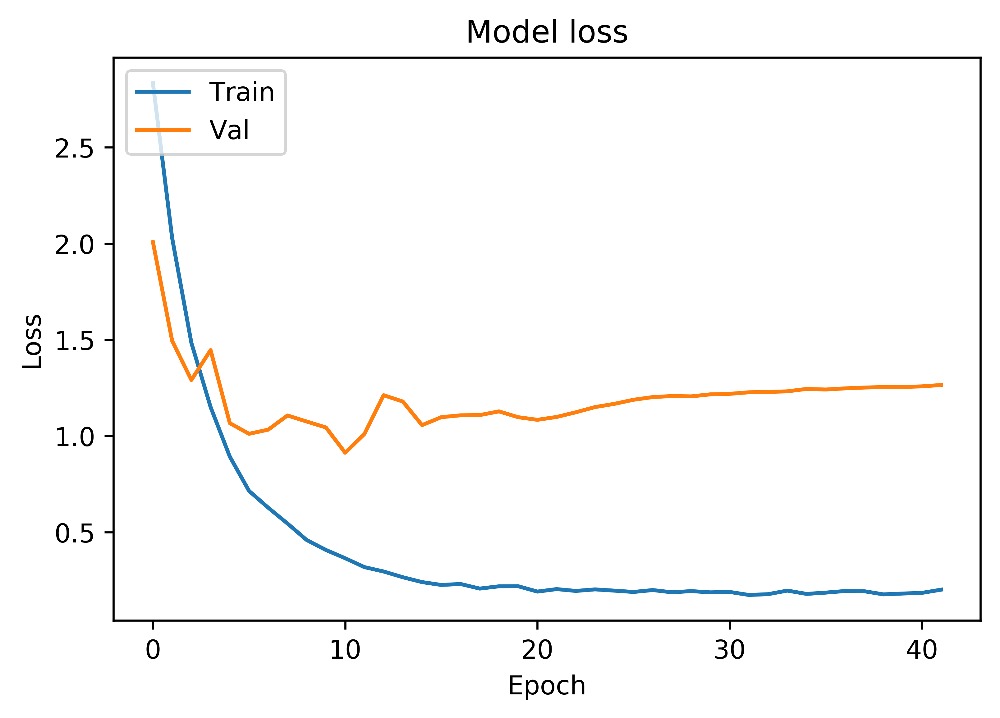

Results from K-fold: 1
acc: 77.22%
632/632 [==============================] - 0s 172us/step
[1.1222148892245716, 0.7721518994886664]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         47    5       10     4          7         0     4          2
gel          5   57        1     1          7         5     2          1
network      2    0       69     1          3         0     4          0
plot         4    0        9    51          2         0    11          2
histology    1    0        4     0         68         1     1          4
sequence     1    2        0     0          0        68     0          8
line         6    0        5     3          3         2    57          3
molecular    0    0        4     0          3         0     1         71
              precision    recall  f1-score   support

         bar       0.71      0.59      0.65        79
         gel       0.89      0.72      0.80        79
     network       0.68      0.87      0.76    


Epoch 00030: val_acc did not improve from 0.79365
Epoch 31/150
2260/2260 [==============================] - 0s 144us/step - loss: 0.2430 - acc: 0.9195 - val_loss: 0.7873 - val_acc: 0.7897

Epoch 00031: val_acc did not improve from 0.79365
Epoch 32/150
2260/2260 [==============================] - 0s 144us/step - loss: 0.2518 - acc: 0.9186 - val_loss: 0.7877 - val_acc: 0.7897

Epoch 00032: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00032: val_acc did not improve from 0.79365
Epoch 33/150
2260/2260 [==============================] - 0s 143us/step - loss: 0.2685 - acc: 0.9088 - val_loss: 0.7907 - val_acc: 0.7897

Epoch 00033: val_acc did not improve from 0.79365


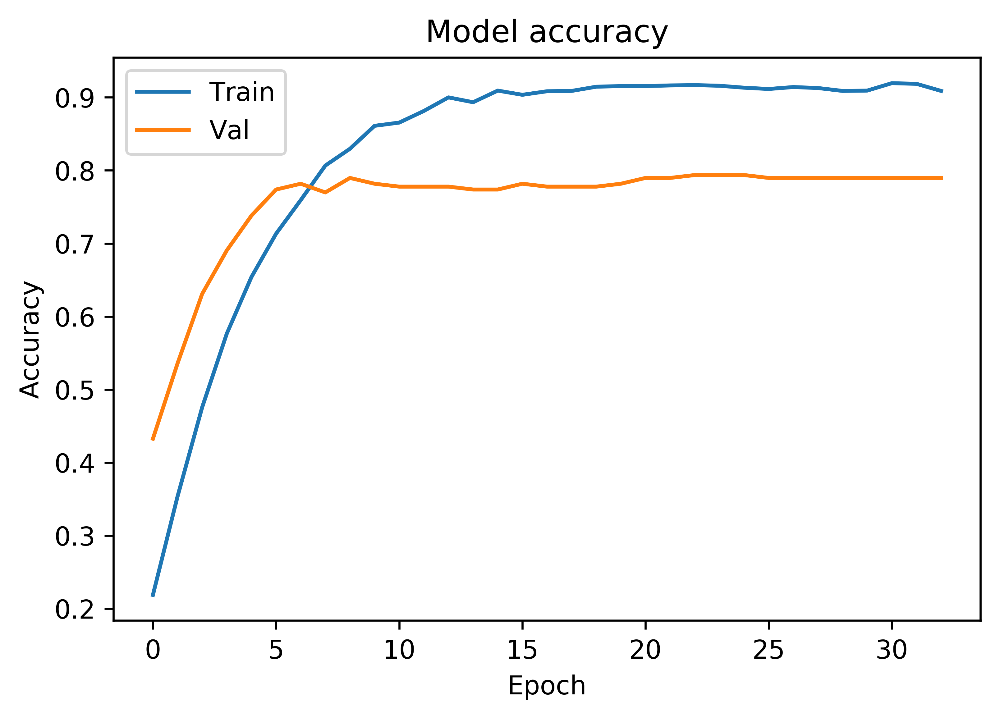

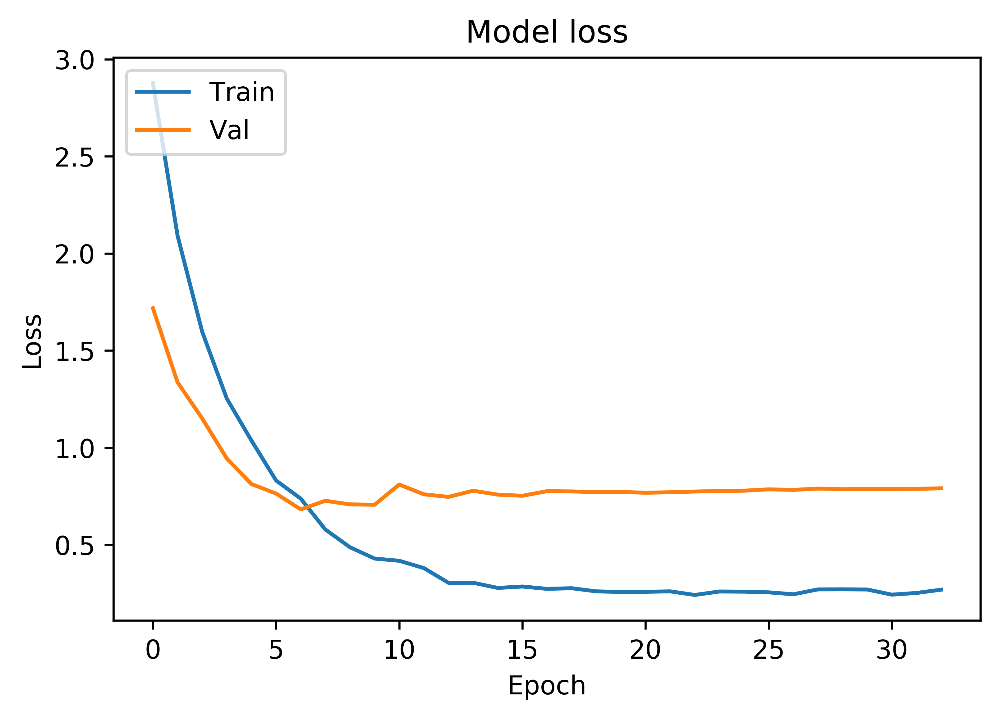

Results from K-fold: 2
acc: 78.64%
632/632 [==============================] - 0s 181us/step
[0.9053313841548147, 0.7863924058177804]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         41    4        5    11          7         3     7          1
gel          6   59        2     1          3         5     1          2
network      1    1       69     1          1         1     4          1
plot         3    1        3    65          2         1     3          1
histology    0    0        2     0         73         0     0          4
sequence     0    1        6     0          0        71     0          1
line         4    1        4     3          6         1    60          0
molecular    0    0       12     0          2         4     2         59
              precision    recall  f1-score   support

         bar       0.75      0.52      0.61        79
         gel       0.88      0.75      0.81        79
     network       0.67      0.87      0.76    

2260/2260 [==============================] - 0s 148us/step - loss: 0.1940 - acc: 0.9367 - val_loss: 0.8722 - val_acc: 0.7897

Epoch 00031: ReduceLROnPlateau reducing learning rate to 1.6000001778593287e-06.

Epoch 00031: val_acc did not improve from 0.79365
Epoch 32/150
2260/2260 [==============================] - 0s 149us/step - loss: 0.1871 - acc: 0.9385 - val_loss: 0.8752 - val_acc: 0.7897

Epoch 00032: val_acc did not improve from 0.79365
Epoch 33/150
2260/2260 [==============================] - 0s 148us/step - loss: 0.1941 - acc: 0.9350 - val_loss: 0.8767 - val_acc: 0.7897

Epoch 00033: val_acc did not improve from 0.79365
Epoch 34/150
2260/2260 [==============================] - 0s 149us/step - loss: 0.1919 - acc: 0.9358 - val_loss: 0.8783 - val_acc: 0.7897

Epoch 00034: val_acc did not improve from 0.79365
Epoch 35/150
2260/2260 [==============================] - 0s 147us/step - loss: 0.1954 - acc: 0.9350 - val_loss: 0.8796 - val_acc: 0.7897

Epoch 00035: val_acc did not improve

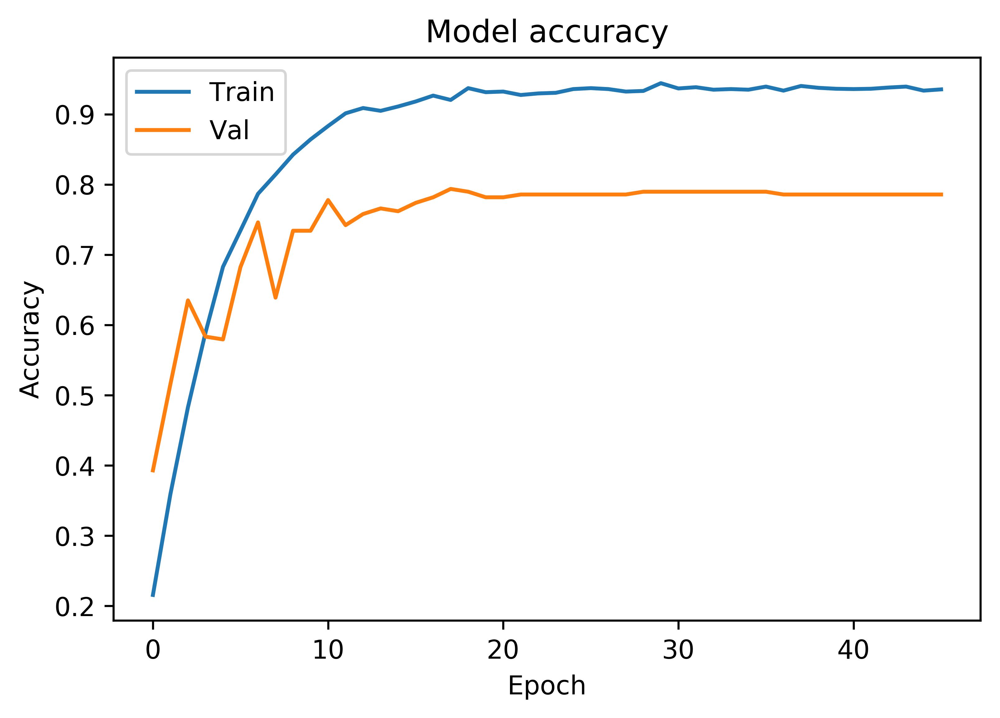

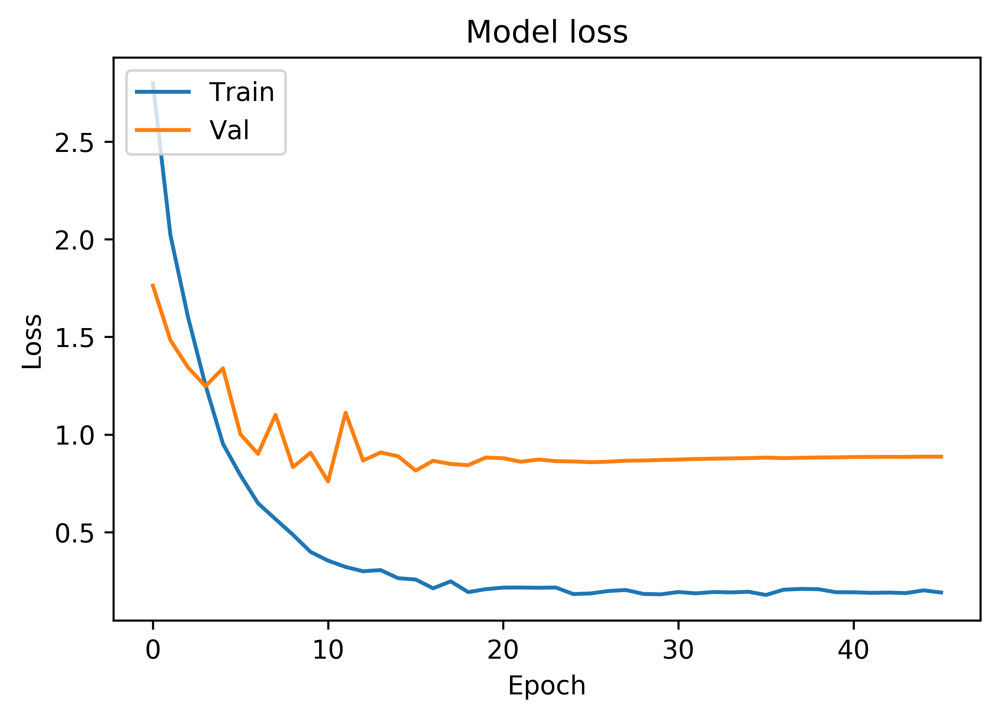

Results from K-fold: 3
acc: 78.96%
632/632 [==============================] - 0s 177us/step
[0.9371912030479576, 0.7895569627798056]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         54    4        3     4          7         1     6          0
gel          5   63        0     0          7         1     3          0
network      3    1       63     2          0         2     3          5
plot         9    3        5    55          1         0     5          1
histology    1    1        1     1         70         0     2          3
sequence     1    4        0     1          0        71     1          1
line         8    1        7     3          4         1    53          2
molecular    0    0        2     1          3         3     0         70
              precision    recall  f1-score   support

         bar       0.67      0.68      0.68        79
         gel       0.82      0.80      0.81        79
     network       0.78      0.80      0.79    

2268/2268 [==============================] - 0s 148us/step - loss: 0.1936 - acc: 0.9365 - val_loss: 1.0329 - val_acc: 0.7579

Epoch 00030: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.

Epoch 00030: val_acc did not improve from 0.76190
Epoch 31/150
2268/2268 [==============================] - 0s 145us/step - loss: 0.1820 - acc: 0.9387 - val_loss: 1.0345 - val_acc: 0.7540

Epoch 00031: val_acc did not improve from 0.76190
Epoch 32/150
2268/2268 [==============================] - 0s 146us/step - loss: 0.1872 - acc: 0.9405 - val_loss: 1.0309 - val_acc: 0.7540

Epoch 00032: val_acc did not improve from 0.76190
Epoch 33/150
2268/2268 [==============================] - 0s 147us/step - loss: 0.1953 - acc: 0.9325 - val_loss: 1.0355 - val_acc: 0.7540

Epoch 00033: val_acc did not improve from 0.76190
Epoch 34/150
2268/2268 [==============================] - 0s 147us/step - loss: 0.1785 - acc: 0.9405 - val_loss: 1.0336 - val_acc: 0.7540

Epoch 00034: val_acc did not improve 

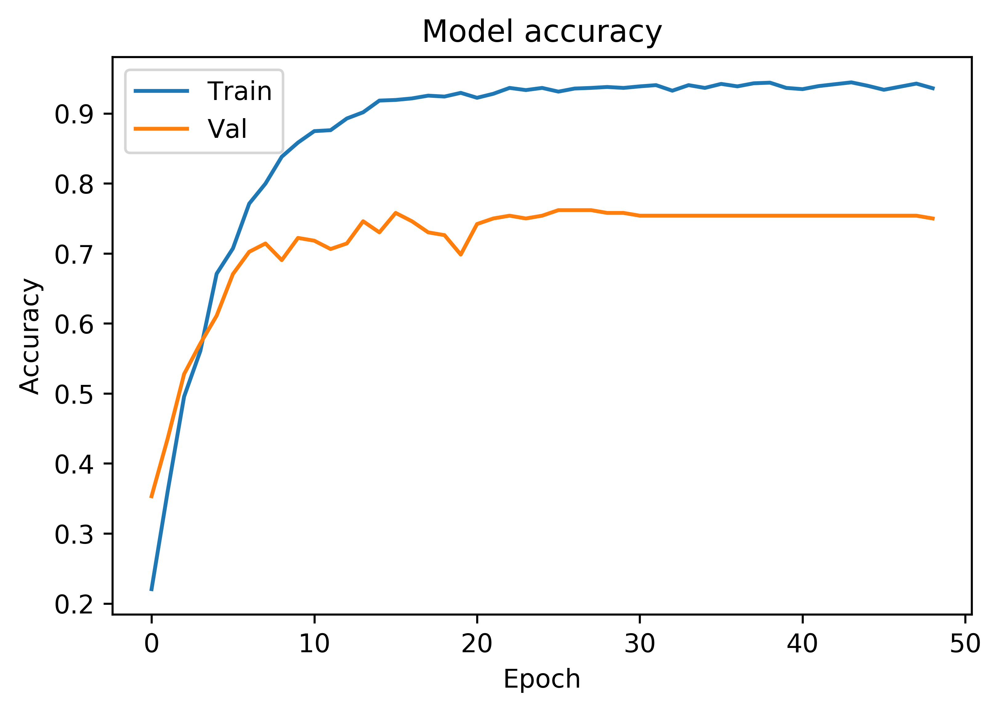

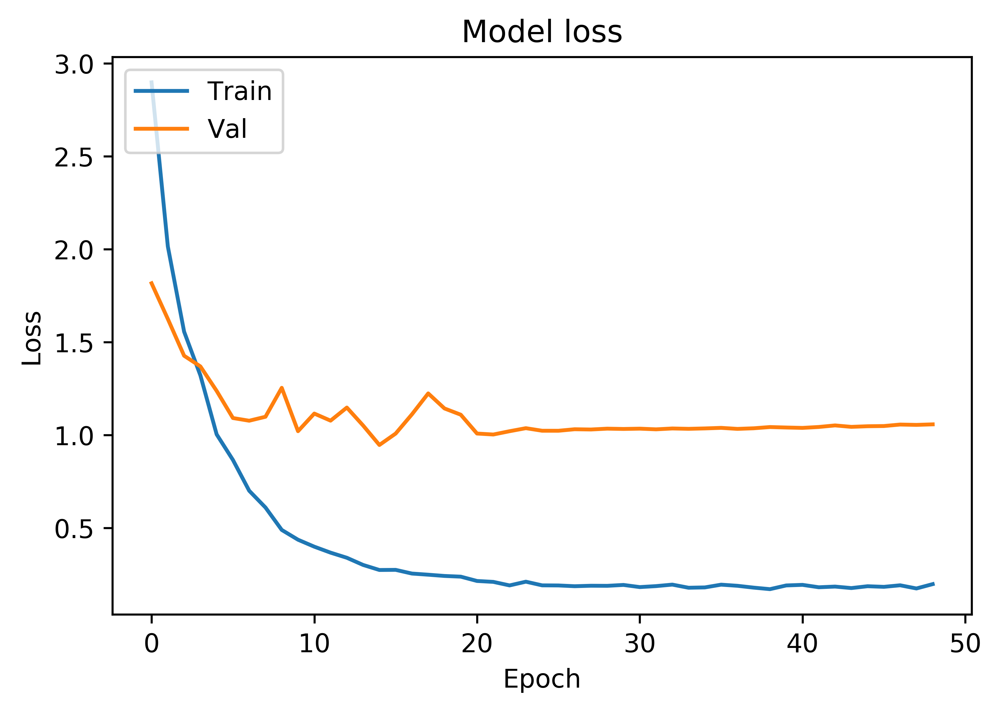

Results from K-fold: 4
acc: 77.88%
624/624 [==============================] - 0s 188us/step
[1.008996497744169, 0.7788461538461539]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         46    5        2     2          8         2    10          3
gel          3   49        1     1         13         2     6          3
network      1    1       69     1          3         0     1          2
plot        11    1        3    51          5         0     7          0
histology    1    0        4     0         70         1     2          0
sequence     1    4        1     0          0        71     1          0
line         2    0        2     6          1         0    62          5
molecular    1    0        6     0          3         0     0         68
              precision    recall  f1-score   support

         bar       0.70      0.59      0.64        78
         gel       0.82      0.63      0.71        78
     network       0.78      0.88      0.83     

2268/2268 [==============================] - 0s 149us/step - loss: 0.2373 - acc: 0.9224 - val_loss: 1.0247 - val_acc: 0.7976

Epoch 00030: val_acc did not improve from 0.80556
Epoch 31/150
2268/2268 [==============================] - 0s 147us/step - loss: 0.2308 - acc: 0.9220 - val_loss: 1.0282 - val_acc: 0.7976

Epoch 00031: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00031: val_acc did not improve from 0.80556
Epoch 32/150
2268/2268 [==============================] - 0s 145us/step - loss: 0.2250 - acc: 0.9277 - val_loss: 1.0286 - val_acc: 0.7976

Epoch 00032: val_acc did not improve from 0.80556
Epoch 33/150
2268/2268 [==============================] - 0s 148us/step - loss: 0.2364 - acc: 0.9167 - val_loss: 1.0309 - val_acc: 0.7976

Epoch 00033: val_acc did not improve from 0.80556
Epoch 34/150
2268/2268 [==============================] - 0s 149us/step - loss: 0.2399 - acc: 0.9162 - val_loss: 1.0346 - val_acc: 0.7976

Epoch 00034: val_acc did not improve from 0.80556
Epo

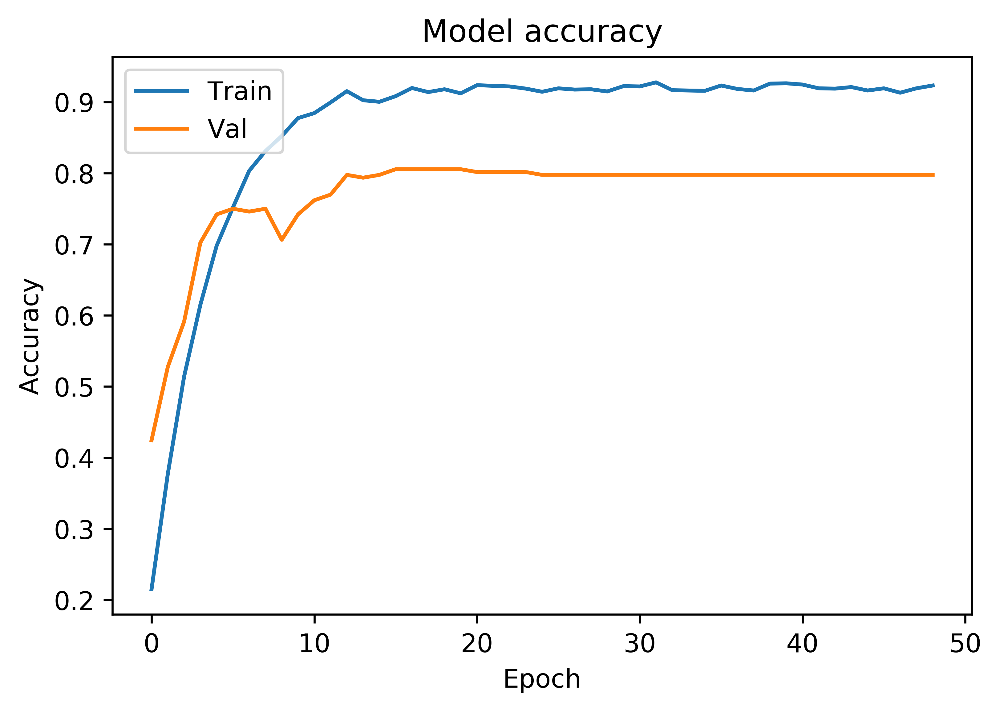

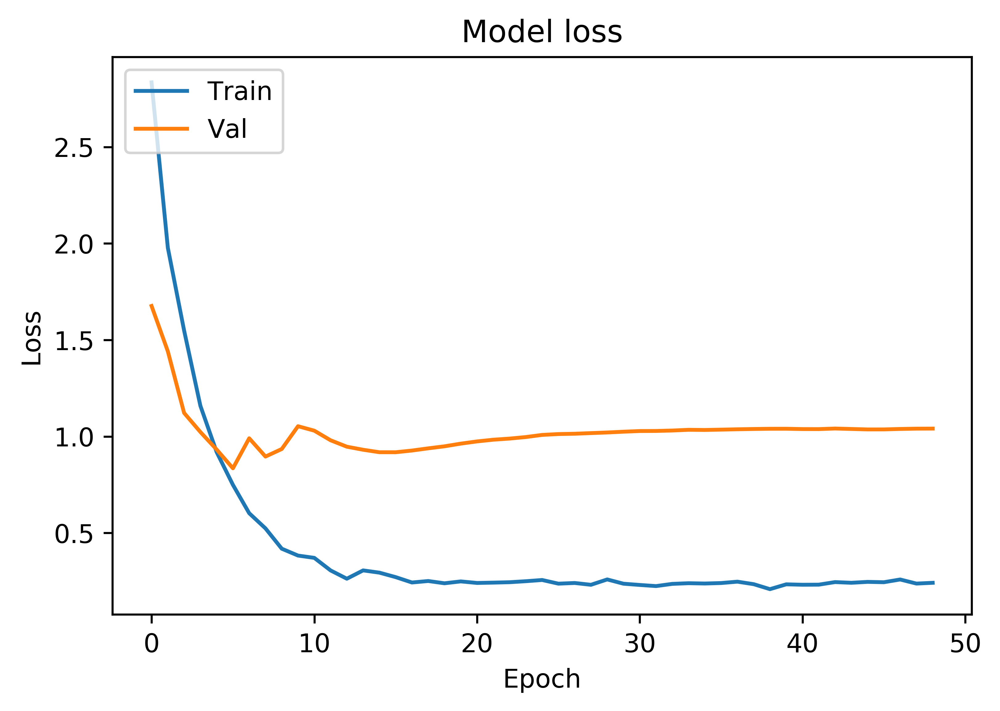

Results from K-fold: 5
acc: 79.01%
624/624 [==============================] - 0s 190us/step
[0.9546312109017984, 0.7900641025641025]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         46    5        4     8          5         0     9          1
gel          3   57        0     3         11         2     0          2
network      1    0       62     3          4         1     2          5
plot         6    0        3    61          0         0     7          1
histology    3    0        1     0         72         0     1          1
sequence     3    3        0     0          0        68     1          3
line         5    5        4     5          3         1    53          2
molecular    0    0        1     0          2         0     1         74
              precision    recall  f1-score   support

         bar       0.69      0.59      0.63        78
         gel       0.81      0.73      0.77        78
     network       0.83      0.79      0.81    

In [27]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_model = Generate_Model(image = False, text=True)
    text_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_text_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_model.fit([X_text[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_text_only_k-fold_{}.hdf5".format(count)
    text_model.save_weights(filepath)
    scores = text_model.evaluate([X_text[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_model, zip(X_text[test], y[test]), image = False, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

### K-Fold validation Multimodal: Train text and images

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 17s 7ms/step - loss: 2.2450 - acc: 0.3602 - val_loss: 2.6587 - val_acc: 0.4405

Epoch 00001: val_acc improved from -inf to 0.44048, saving model to model_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.3429 - acc: 0.5779 - val_loss: 0.9722 - val_acc: 0.7063

Epoch 00002: val_acc improved from 0.44048 to 0.70635, saving model to model_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.8954 - acc: 0.7062 - val_loss: 1.0258 - val_acc: 0.7302

Epoch 00003: val_acc improved from 0.70635 to 0.73016, saving model to model_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.6445 - acc: 0.7770 - val_loss: 0.7471 - 

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0176 - acc: 0.9947 - val_loss: 0.4752 - val_acc: 0.8770

Epoch 00037: val_acc did not improve from 0.88095
Epoch 38/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0177 - acc: 0.9956 - val_loss: 0.4758 - val_acc: 0.8770

Epoch 00038: val_acc did not improve from 0.88095
Epoch 39/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0228 - acc: 0.9925 - val_loss: 0.4774 - val_acc: 0.8770

Epoch 00039: val_acc did not improve from 0.88095
Epoch 40/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0173 - acc: 0.9960 - val_loss: 0.4774 - val_acc: 0.8770

Epoch 00040: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00040: val_acc did not improve from 0.88095
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0177 - acc: 0.9947 - val_loss: 0.4826 - val_acc: 0.8770

Epoch 00041: val_acc did not improve from 0.88095
Epoch 42/150


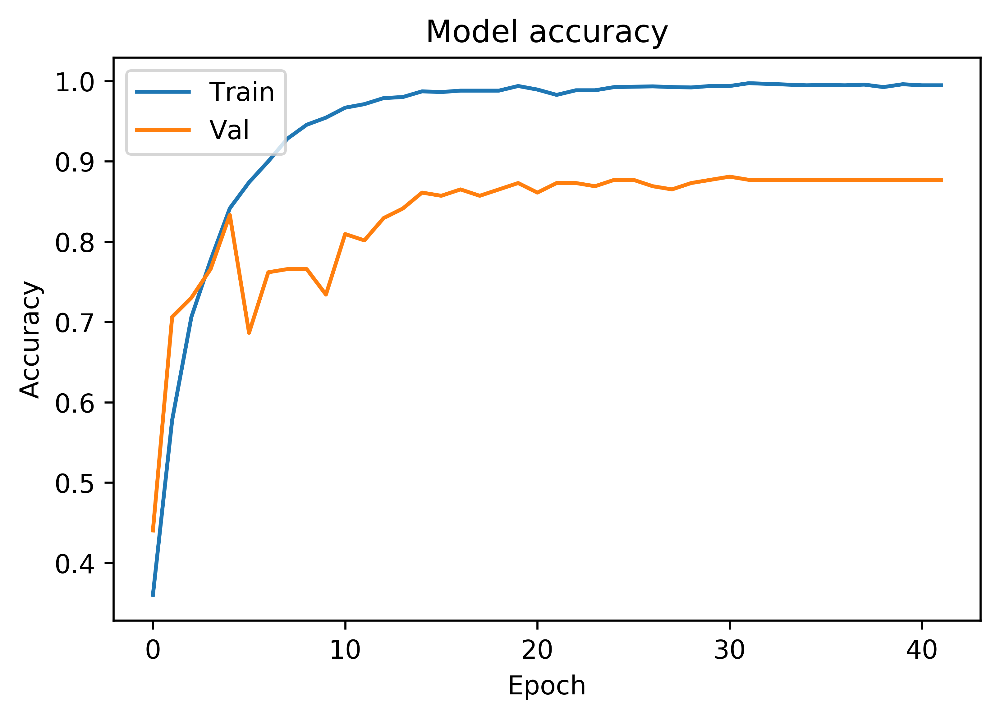

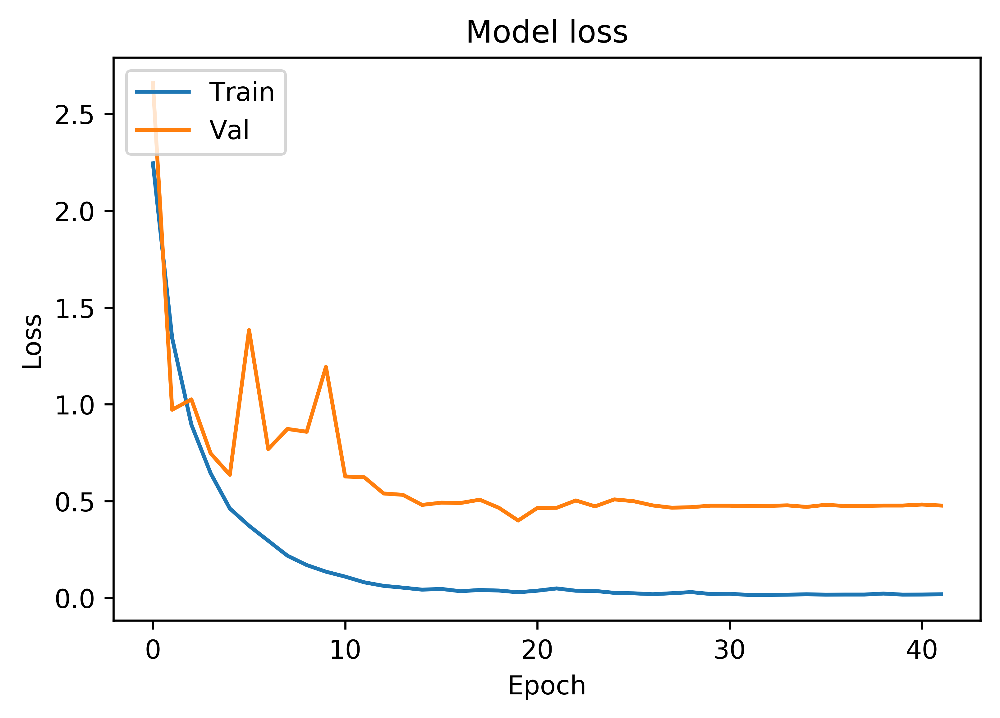

Results from K-fold: 1
acc: 88.29%
632/632 [==============================] - 1s 890us/step
[0.4369639102133769, 0.8829113916505741]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         68    0        2     4          0         0     3          2
gel          1   75        0     0          1         1     1          0
network      1    0       70     0          0         2     4          2
plot         2    0        4    55          0         0    16          2
histology    0    0        0     0         78         0     1          0
sequence     0    0        1     0          0        76     1          1
line         3    4        5     3          0         0    61          3
molecular    0    0        2     1          0         0     1         75
              precision    recall  f1-score   support

         bar       0.91      0.86      0.88        79
         gel       0.95      0.95      0.95        79
     network       0.83      0.89      0.86    

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0104 - acc: 0.9982 - val_loss: 0.3390 - val_acc: 0.9048

Epoch 00032: val_acc did not improve from 0.91270
Epoch 33/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0089 - acc: 0.9973 - val_loss: 0.3545 - val_acc: 0.9008

Epoch 00033: val_acc did not improve from 0.91270
Epoch 34/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0090 - acc: 0.9973 - val_loss: 0.3362 - val_acc: 0.9087

Epoch 00034: val_acc did not improve from 0.91270
Epoch 35/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0112 - acc: 0.9969 - val_loss: 0.3302 - val_acc: 0.9167

Epoch 00035: val_acc improved from 0.91270 to 0.91667, saving model to model_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 36/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0077 - acc: 0.9978 - val_loss: 0.3270 - val_acc: 0.9167

Epoch 00036: val_acc did not improve from 0.91667

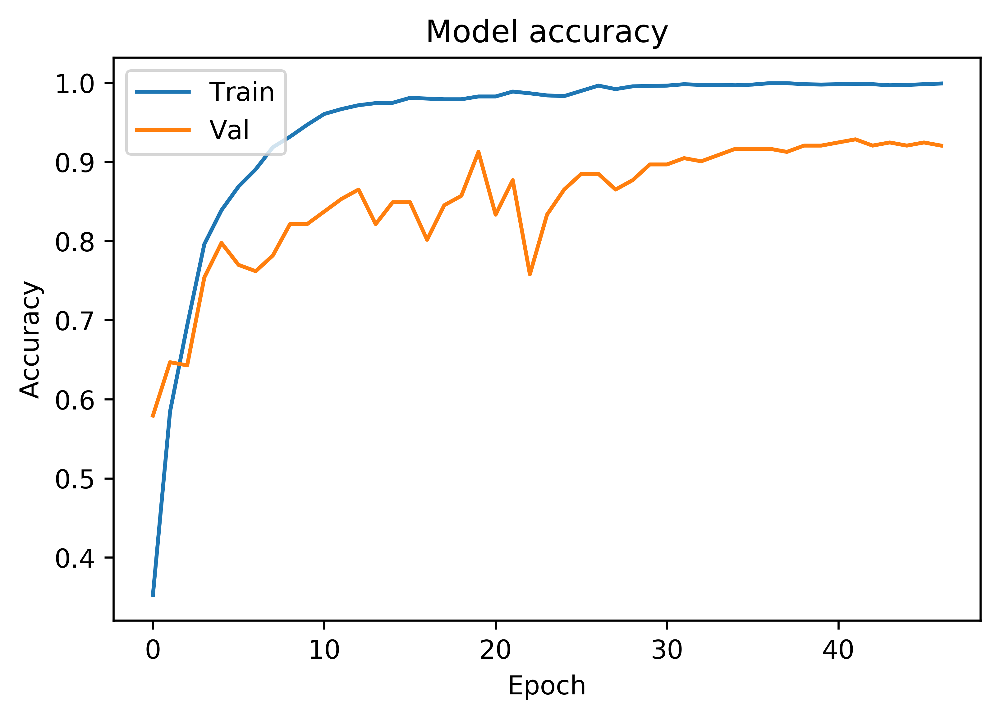

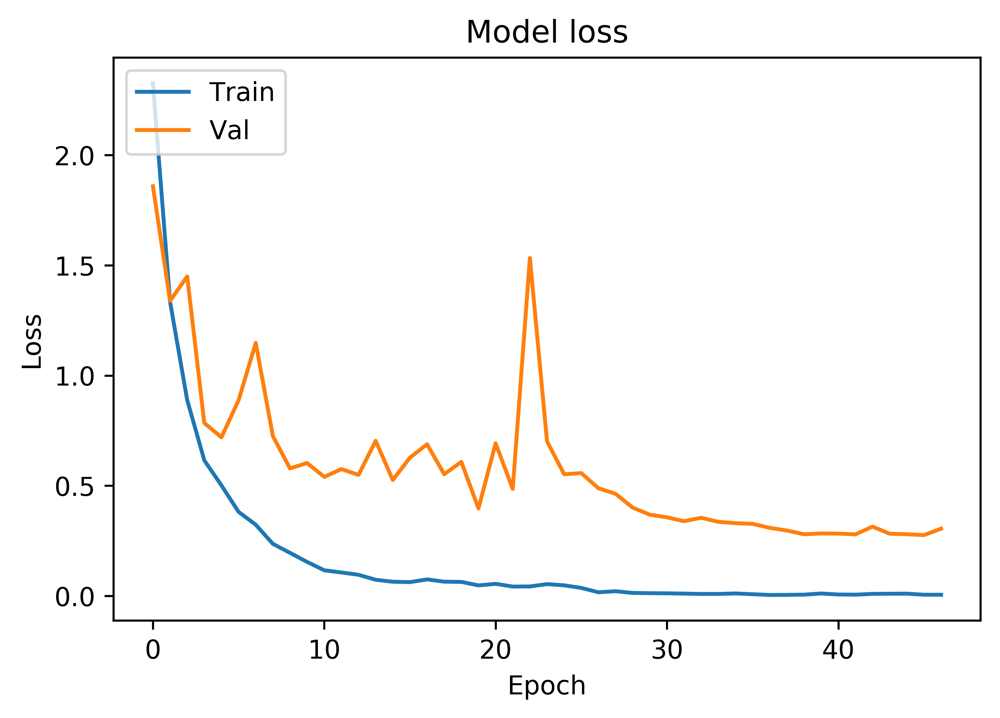

Results from K-fold: 2
acc: 88.92%
632/632 [==============================] - 1s 877us/step
[0.513582134973022, 0.8892405055746248]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         66    2        3     2          0         3     2          1
gel          0   72        0     2          1         2     2          0
network      1    0       72     1          2         2     0          1
plot         1    2        2    59          1         2    12          0
histology    0    1        1     0         75         0     1          1
sequence     0    2        1     0          0        76     0          0
line         0    0        4     1          2         3    67          2
molecular    0    0        3     0          0         0     1         75
              precision    recall  f1-score   support

         bar       0.97      0.84      0.90        79
         gel       0.91      0.91      0.91        79
     network       0.84      0.91      0.87     

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0131 - acc: 0.9969 - val_loss: 0.4169 - val_acc: 0.8810

Epoch 00031: val_acc improved from 0.88095 to 0.88095, saving model to model_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 32/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0184 - acc: 0.9947 - val_loss: 0.4132 - val_acc: 0.8849

Epoch 00032: val_acc improved from 0.88095 to 0.88492, saving model to model_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 33/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0128 - acc: 0.9978 - val_loss: 0.4523 - val_acc: 0.8770

Epoch 00033: val_acc did not improve from 0.88492
Epoch 34/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0248 - acc: 0.9934 - val_loss: 0.4732 - val_acc: 0.8770

Epoch 00034: val_acc did not improve from 0.88492
Epoch 35/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0155 - acc: 0.9965 - val_lo

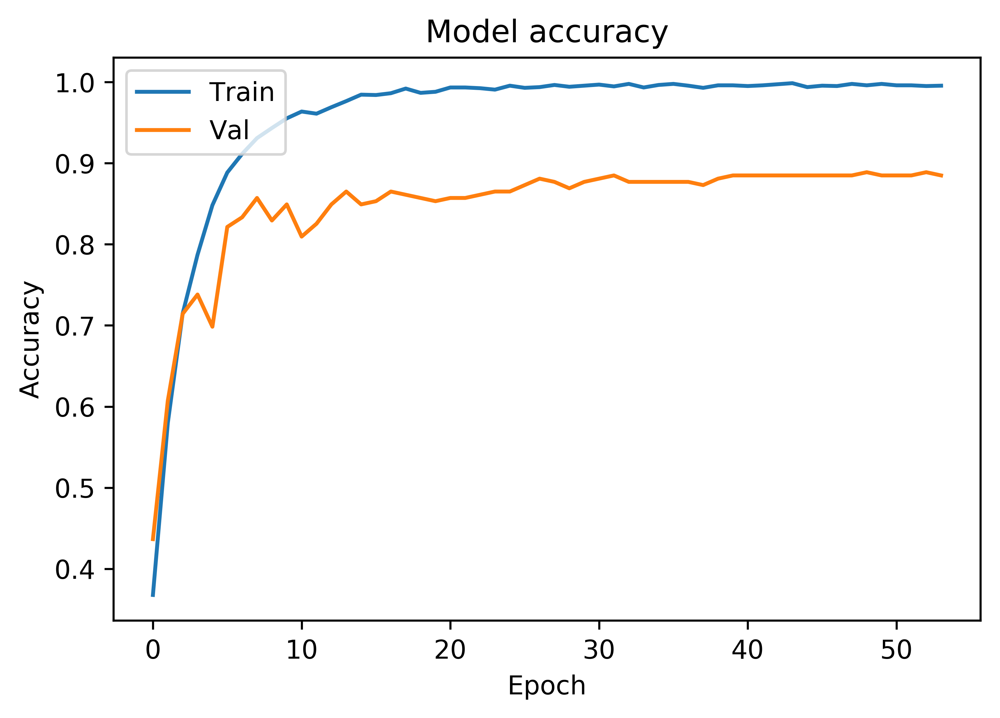

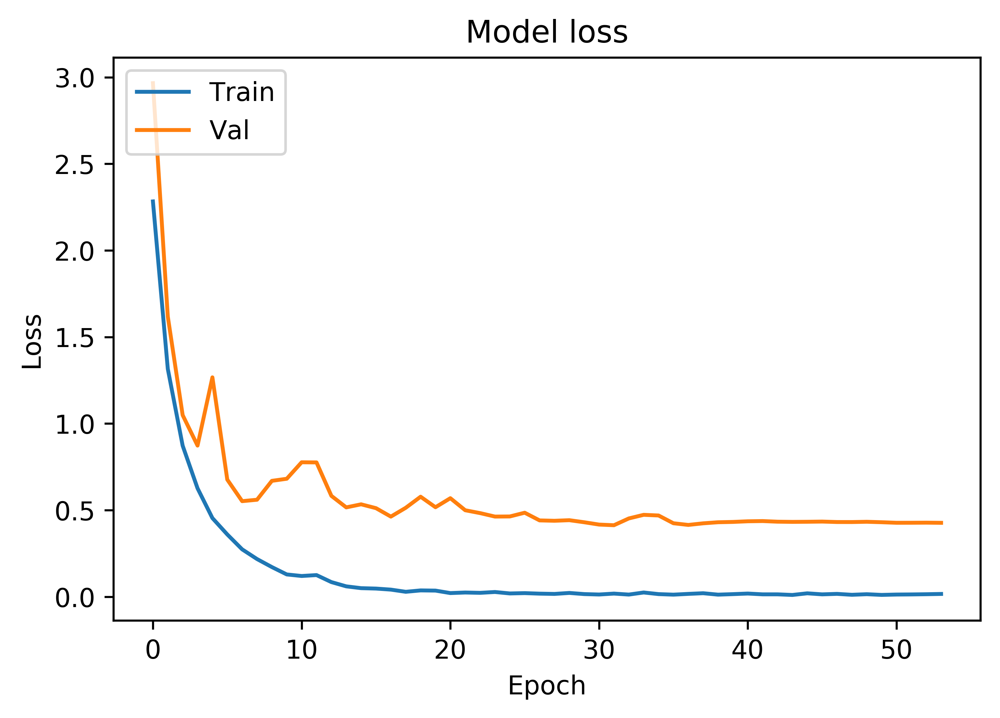

Results from K-fold: 3
acc: 90.35%
632/632 [==============================] - 1s 868us/step
[0.4364667792297617, 0.903481013412717]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         71    3        1     2          0         1     1          0
gel          0   76        1     1          0         0     1          0
network      0    0       75     0          0         0     1          3
plot         1    1        7    61          0         0     8          1
histology    0    1        0     0         77         0     0          1
sequence     0    2        4     0          0        73     0          0
line         2    2        6     5          1         0    60          3
molecular    0    0        1     0          0         0     0         78
              precision    recall  f1-score   support

         bar       0.96      0.90      0.93        79
         gel       0.89      0.96      0.93        79
     network       0.79      0.95      0.86     

2268/2268 [==============================] - 3s 1ms/step - loss: 0.0153 - acc: 0.9960 - val_loss: 0.5704 - val_acc: 0.8968

Epoch 00029: val_acc did not improve from 0.91667
Epoch 30/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0162 - acc: 0.9969 - val_loss: 0.5893 - val_acc: 0.9127

Epoch 00030: val_acc did not improve from 0.91667
Epoch 31/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0142 - acc: 0.9969 - val_loss: 0.6399 - val_acc: 0.9048

Epoch 00031: val_acc did not improve from 0.91667
Epoch 32/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0129 - acc: 0.9978 - val_loss: 0.6256 - val_acc: 0.8929

Epoch 00032: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00032: val_acc did not improve from 0.91667
Epoch 33/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0131 - acc: 0.9965 - val_loss: 0.6194 - val_acc: 0.8968

Epoch 00033: val_acc did not improve from 0.91

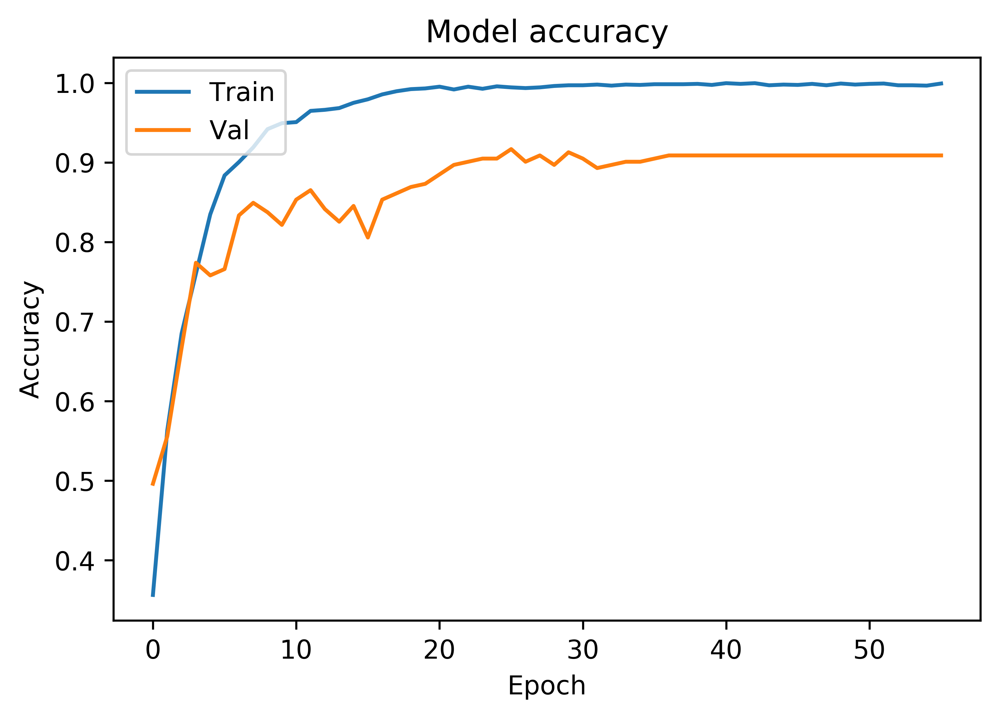

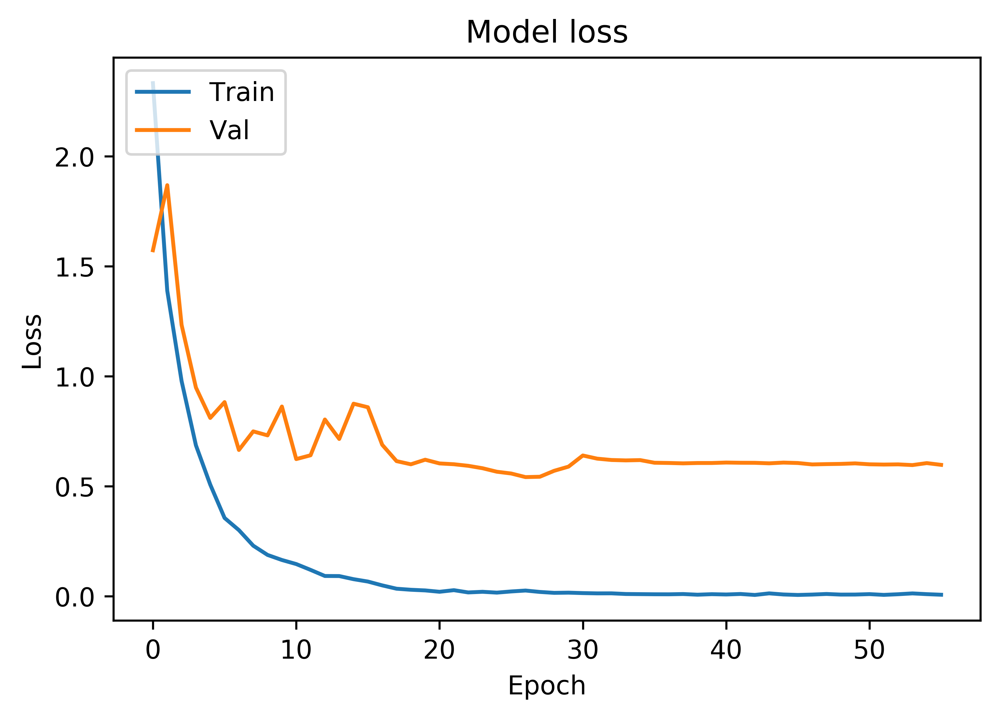

Results from K-fold: 4
acc: 91.83%
624/624 [==============================] - 1s 855us/step
[0.3275312212988352, 0.9182692307692307]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         70    1        2     2          0         0     3          0
gel          1   73        1     0          0         0     2          1
network      0    0       70     2          0         0     1          5
plot         3    0        1    69          0         0     4          1
histology    0    0        0     0         76         0     1          1
sequence     0    0        1     0          2        73     0          2
line         1    0        3     5          0         0    66          3
molecular    0    0        1     0          0         0     1         76
              precision    recall  f1-score   support

         bar       0.93      0.90      0.92        78
         gel       0.99      0.94      0.96        78
     network       0.89      0.90      0.89    


Epoch 00029: val_acc did not improve from 0.88889
Epoch 30/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0097 - acc: 0.9991 - val_loss: 0.5136 - val_acc: 0.8810

Epoch 00030: val_acc did not improve from 0.88889
Epoch 31/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0170 - acc: 0.9943 - val_loss: 0.5032 - val_acc: 0.8849

Epoch 00031: val_acc did not improve from 0.88889
Epoch 32/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0178 - acc: 0.9951 - val_loss: 0.4963 - val_acc: 0.8929

Epoch 00032: val_acc improved from 0.88889 to 0.89286, saving model to model_fusion_weights/best_weight_image_text_k-fold_5.hdf5
Epoch 33/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0133 - acc: 0.9969 - val_loss: 0.5020 - val_acc: 0.8929

Epoch 00033: val_acc improved from 0.89286 to 0.89286, saving model to model_fusion_weights/best_weight_image_text_k-fold_5.hdf5
Epoch 34/150
2268/2268 [===================

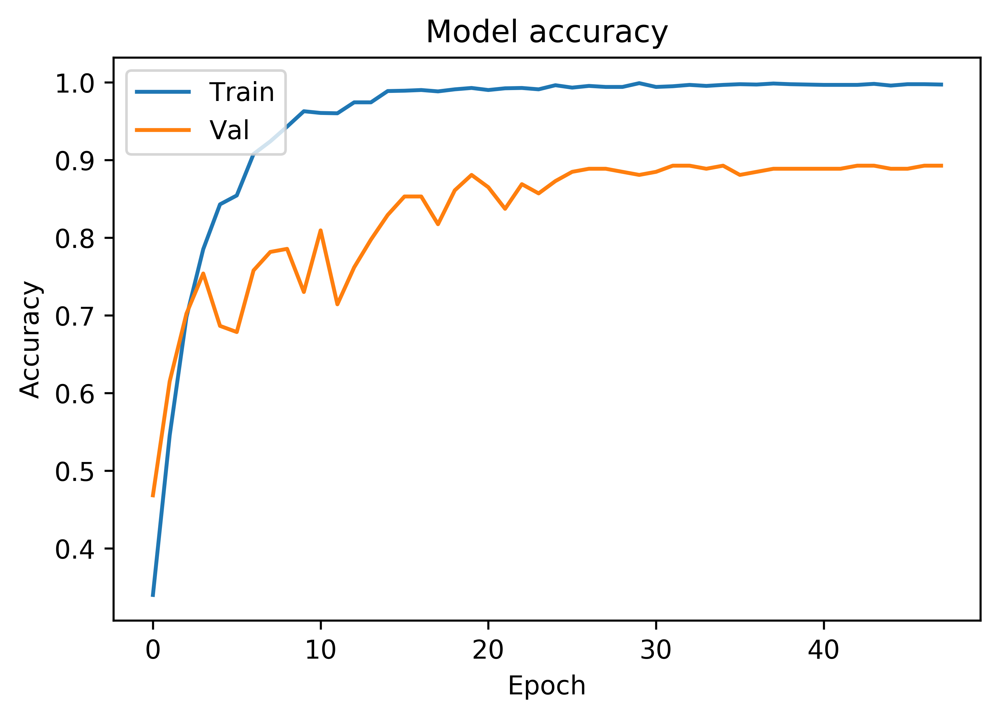

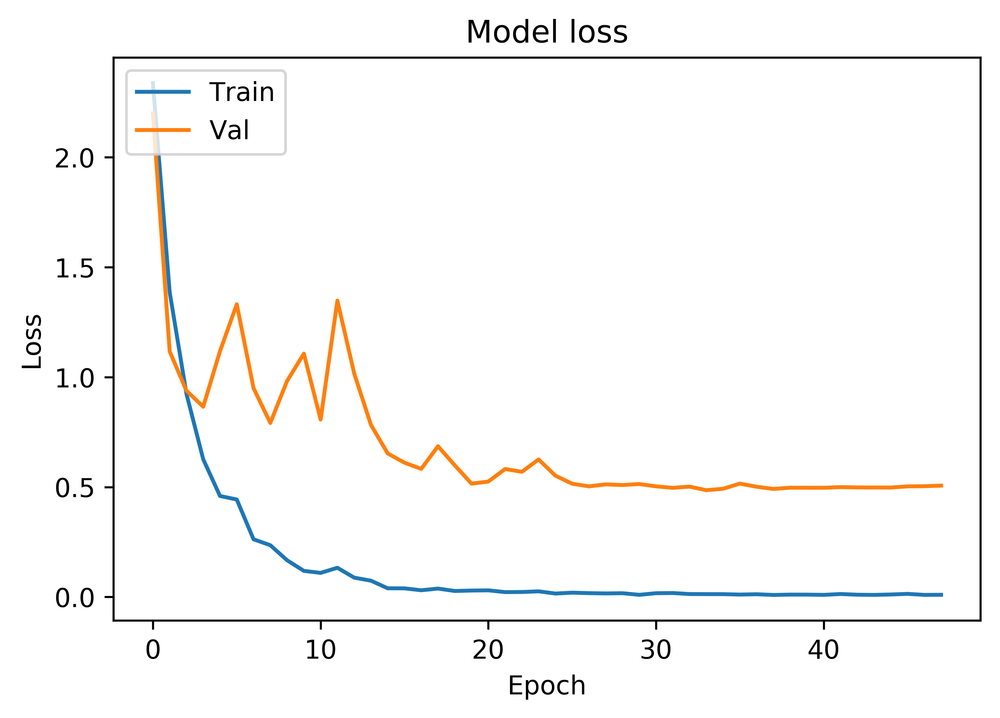

Results from K-fold: 5
acc: 87.02%
624/624 [==============================] - 1s 821us/step
[0.6690553321909064, 0.8701923076923077]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         62    2        2     6          1         0     5          0
gel          0   69        2     1          2         2     0          2
network      0    0       70     1          0         0     2          5
plot         2    0        3    61          2         0     9          1
histology    0    1        0     0         76         0     1          0
sequence     0    0        4     0          0        72     0          2
line         1    1        8     5          1         2    58          2
molecular    0    0        1     0          2         0     0         75
              precision    recall  f1-score   support

         bar       0.95      0.79      0.87        78
         gel       0.95      0.88      0.91        78
     network       0.78      0.90      0.83    

In [28]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_image_model = Generate_Model(image = True, text=True)
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="model_fusion_weights/best_weight_image_text_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    plot_model_history(history)
    filepath="model_fusion_weights/final_weight_image_text_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[test], X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[test], X_image[test], y[test]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

### Inspect images

blue = ground truth, red = prediction


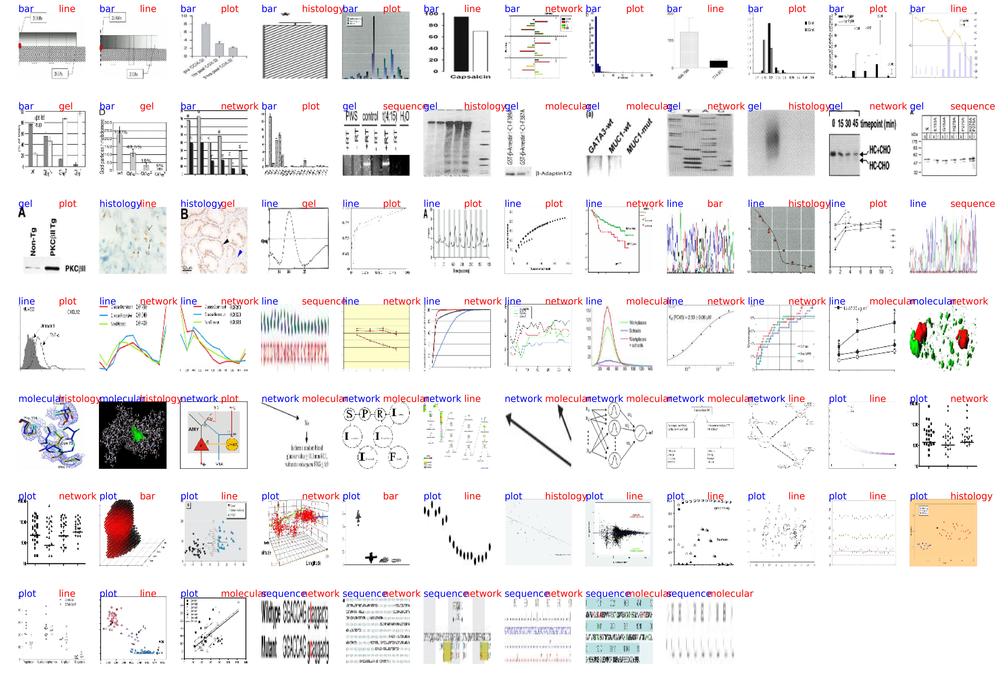

In [29]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[test] ]
test_wrong = [im for im in zip(X_image[test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')